# Library

In [2]:
# Ignore the warnings
import warnings
# warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# System related and data input controls
import os

# Python path
import sys
base_folder = 'DataScience'
location_base = os.path.join(os.getcwd().split(base_folder)[0], base_folder)
location_module = [os.path.join(location_base, 'Module')] 
for each in location_module:
    if each not in sys.path:
        sys.path.append(each)

# Auto reload of library
%reload_ext autoreload
%autoreload 2

from import_KK import *
DeviceStrategy_CPU()
from preprocessing_KK import *
from preprocessing_project_KK import *
from description_KK import *
from algorithm_machinelearning_KK import *
from algorithm_deeplearning_KK import *
from evaluation_KK import *
from visualization_KK import *

Cuda is Ready?  True

Tensorflow Version:  2.19.0
Keras Version:  3.10.0
Torch Version:  2.7.1+cu126


# Hyperparameters

In [3]:
# Data
FOLDER_LOCATION = os.path.join('.', 'Data')
DF_YEAR = [2022, 2021, 2020, 2019, 2018]

# Preprocessing
Y_colname = '학습효과성'
X_custom = {
    '문C1) 앞으로 참여하길 희망하는 프로그램은 무엇입니까? (중복응답)1': {99:0}, 
    '학력별': {4:0}, 
    '문H1) 귀하께서는 전반적으로 현재의 생활에 얼마나 만족하십니까?': {99:1}, 
    '직장의 규모': {9:0},
    '근무기간': {9:0}
}
X_dummy = [
    'DQ1. 귀하의 최종 학력은 어떻게 되십니까?__상태구분',
    'DQ6. 귀하께서는 건강에 자신 있습니까?',
    'DQ7. 귀하의 주된 소득원천은 무엇입니까?',
    'DQ9. 귀하의 현재 고용형태는 어떻게 되십니까?',
    'DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?',
    '직업'
]           
X_reverse = [
    '문A1-1) 작년(21.01.01~21.12.31) (1) 학위(졸업장) 취득을 위한 교육 참여 경험 여부',
    '문B1-5) 귀하께서는 작년에 다음과 같은 학습에 참여해 본 적이 있으십니까?__학습을 목적으로 텔레비전^ 라디오 등을 활용해서 새로운 지식을 습득한 적이 있다',
    '문B1-7) 귀하께서는 작년에 다음과 같은 학습에 참여해 본 적이 있으십니까?__역사적·자연적·산업적 장소를 방문해서 지식을 습득한 적이 있다',
    '문B1-1) 귀하께서는 작년에 다음과 같은 학습에 참여해 본 적이 있으십니까?__가족^ 친구 또는 직장동료^ 상사의 도움이나 조언을 통해 지식을 습득한 적이 있다',
    '문B1-2) 귀하께서는 작년에 다음과 같은 학습에 참여해 본 적이 있으십니까?__트위터^ 페이스북^ 카페^ 블로그^ 밴드 등을 활용해서 새로운 정보나 기술을 습득한 적이 있다',
    '문B1-3) 귀하께서는 작년에 다음과 같은 학습에 참여해 본 적이 있으십니까?__유튜브(Youtube) 등을 활용해서 새로운 정보나 기술을 습득한 적이 있다',
    '문B1-4) 귀하께서는 작년에 다음과 같은 학습에 참여해 본 적이 있으십니까?__인터넷 뉴스^ E-book 등 온라인매체를 활용해서 새로운 정보나 기술을 습득한 적이 있다',
    '문B1-6) 귀하께서는 작년에 다음과 같은 학습에 참여해 본 적이 있으십니까?__책이나 전문잡지 등 인쇄매체를 활용해서 지식을 습득한 적이 있다',
    '문B1-8) 귀하께서는 작년에 다음과 같은 학습에 참여해 본 적이 있으십니까?__도서관 등을 방문해서 새로운 사실을 배운 적이 있다',
    '문B1-9) 귀하께서는 작년에 다음과 같은 학습에 참여해 본 적이 있으십니까?__축제^ 박람회^ 음악회 등에 참여해서 무언가를 새롭게 배우거나 깊이 있게 알게된 적이 있다',
    '문B1-10) 귀하께서는 작년에 다음과 같은 학습에 참여해 본 적이 있으십니까?__스포츠^ 등산 등 신체를 움직이는 활동에 참여해서 무언가를 새롭게 배우거나 깊이 있게 알게 된 적이 있다',
    '문C2) 귀하께서는 작년(교육이나 학습 프로그램의 참여여부와 관계없이)에 참여하고 싶었지만 참여하지 못했던 평생교육 프로그램이 있었습니까?',
    '문D1) 귀하께서는 작년에 평생교육 프로그램 관련 정보를 접한 적이 있습니까?',
    'DQ8. 귀하께서는 현재 수입을 목적으로 일하고 계십니까?',
    '경활상태',
    '지역규모별',
    '건강에 대한 자신감',
    '취약계층',
    '취업구분',
    '고용형태',
    '평생학습 참여자',
    '형식교육 참여자',
    '비형식교육 참여자',
    '직업관련 비형식교육 참여자',
    '동시 참여자'
]
X_delete = [
    'ID', '원가중치', '평생학습 참여자', '직업관련 비형식교육 참여자', '동시 참여자',
    # DQ컬럼과 중복(by 조은지)
    '학력별', '자녀유무 및 막내자녀 상태', '동거가족 유무', '부양가족 유무', '취학 전의 손자/손녀 유무', 
    '건강에 대한 자신감', '고용형태', '직업', '직장의 규모', '근무기간',
    '문A1-1) 작년(21.01.01~21.12.31) (1) 학위(졸업장) 취득을 위한 교육 참여 경험 여부'
]
TEST_SIZE = 0.2
RANDOM_STATE = 123
CLASS_STAT = True
SAMPLING_METHOD = 'auto'
SAMPLING_STRATEGY = 'auto'    # 'minority', 'not majority', 'not minority', 'all', 'auto'
SCALER = 'minmax'
LABEL_LIST = ['Non-satisfaction', 'Satisfaction']

# Model
TUNE_TRIALS = 100
CV_SPLITS = 5
TUNE_METRIC = 'auto'
TUNE_METRIC_DL = 'val_AUC' # 'AUC', 'Accuracy', 'F1-score', 'loss', 'val_AUC', 'val_Accuracy', 'val_F1-score', 'val_loss'
################
tf.random.set_seed(123)
NODE_MLP = [128, 256, 128, 64, 32, 10]
NODE_CNN1 = [128, 256, 128]
NODE_CNN2 = [64, 32, 10]
WEIGHT_METHOD = None   # None, 'class', 'sample'
VALIDATION_SPLIT = None
BATCH_SIZE = 64
EPOCHS = 50
VERBOSE = 0
################
SHAP = True
FEATURE_PERTURBATION = 'tree_path_dependent'    # 'tree_path_dependent', 'interventional'
X_TOP_DISPLAY = 50
DEPENDENCY = False
################
METRIC_FINAL = "F1-score"

# Save
SAVE_NAME_PREDSTATTR = 'DescriptiveStatistics_BinaryPredTrain.csv'
SAVE_NAME_PREDSTATTE = 'DescriptiveStatistics_BinaryPredTest.csv'


# Data Merge

In [4]:
# Data Loading
df_dict = dict()
df_columns = pd.read_excel(os.path.join(FOLDER_LOCATION, '평생교육실태조사_코드명통합_수정본.xlsx')).iloc[:,2:]
for year in DF_YEAR:
    folder_location=os.path.join(FOLDER_LOCATION, '{}_총괄_20250320_36011.csv'.format(year))
    df_dict[year] = pd.read_csv(folder_location, encoding='cp949')
    print(year, df_dict[year].shape)
    ## 변수명 DF_YEAR[0]기준으로 동일하게 변경
    if year != DF_YEAR[0]:
        df_sub = pd.concat([df_columns[[col for col in df_columns.columns if col.split('_')[1] == str(year)]], df_columns.iloc[:,[0]]], axis=1)
        df_rename = dict(df_sub[df_sub.iloc[:,1] != 0].dropna().reset_index().iloc[:,1:].values)
        df_dict[year] = df_dict[year].rename(columns=df_rename)
      
# Feature Comparison
colname_compare, colname_common = table_compare_dfscolname(df_dict[DF_YEAR[0]], [df_dict[i] for i in DF_YEAR[1:]],
                                                           colname_list=DF_YEAR)

## Final Feature
for year in DF_YEAR:
    ## 사용할 변수명 추출
    colnames = list(colname_common[[i for i in colname_common.columns if i.split('_')[1] == str(year)]].values.flatten())
    
    ## 최종선택과 추가해야할 변수 구분
    colname_select, colname_add = [], []
    for idx, colname in enumerate(colnames):
        if colname != 0:
            colname_select.append(colname)
        else:
            colname_add.append([i for i in colname_common.iloc[idx,:].unique() if i != 0][0])
            
    ## 변수 업데이트
    df_dict[year] = df_dict[year][colname_select]
    for add in colname_add:
        df_dict[year][add] = np.nan

## df 생성
df = dict_to_concatdf(df_dict)

2022 (9968, 437)
2021 (9905, 454)
2020 (9776, 434)
2019 (9973, 511)
2018 (11747, 600)


0it [00:00, ?it/s]

  0%|          | 0/5 [00:00<?, ?it/s]

Final Shape of df:  (51369, 368)


# Preprocessing

In [5]:
# 비형식교육 참여자 여부 분리
df_train = df[df['비형식교육 참여자'] == 1].reset_index().iloc[:,1:]
df_test = df[df['비형식교육 참여자'] != 1].reset_index().iloc[:,1:]


Preprocessing for Data Prepare...
Initial Shape:  (18117, 368)

Deleting Non-meaning Variables...
Shape:  (18117, 339)

Preprocessing NAN...
Column Deleting...
These  78.17109144542773 %( 265 ) columns are containing more than  50.0 % null values!: ['문A2-1) 프로그램 유형__(1)학위취득을 위한 교육_1', '문A2-6) 연간참여시간__(1)학위취득을 위한 교육_1', '문A2-7) 자기부담학습비__(1)학위취득을 위한 교육_1', '문A2-5) 참여목적__(1)학위취득을 위한 교육_1', '문A2-1) 프로그램 유형__(2)성인기초 및 문자해득교육_1', '문A2-2) 프로그램 형태__(2)성인기초 및 문자해득교육_1', '문A2-3) 기관 유형__(2)성인기초 및 문자해득교육_1', '문A2-5) 참여목적__(2)성인기초 및 문자해득교육_1', '문A2-6) 연간참여시간__(2)성인기초 및 문자해득교육_1', '문A2-7) 자기부담학습비__(2)성인기초 및 문자해득교육_1', '문A2-8) 학습비 외부 지원여부__(2)성인기초 및 문자해득교육_1', '문A2-9) 학습비 외부 지원기관__(2)성인기초 및 문자해득교육_1', '문A2-10) 프로그램만족도__(2)성인기초 및 문자해득교육_1', '문A2-11) 프로그램 불만족 요인(중복응답)__(2)성인기초 및 문자해득교육_1-1', '문A2-11) 프로그램 불만족 요인(중복응답)__(2)성인기초 및 문자해득교육_1-2', '문A2-11) 프로그램 불만족 요인(중복응답)__(2)성인기초 및 문자해득교육_1-3', '문A2-11) 프로그램 불만족 요인(중복응답)__(2)성인기초 및 문자해득교육_1-5', '문A2-11) 프로그램 불만족 요인(중복응답)__(2)성인기초 및 문자해득교육_1-6', '문A2-11) 

  0%|          | 0/27 [00:00<?, ?it/s]


Shape of Data:  (18117, 73)
Complete of fillna!
Shape:  (18117, 73)
Dummy Feature Generating...


  0%|          | 0/6 [00:00<?, ?it/s]

Shape:  (18117, 100)

Object X Features:  []
Complete X Object Processing!
(6399, 99) (6399, 1)
(1600, 99) (1600, 1)
Data Split!


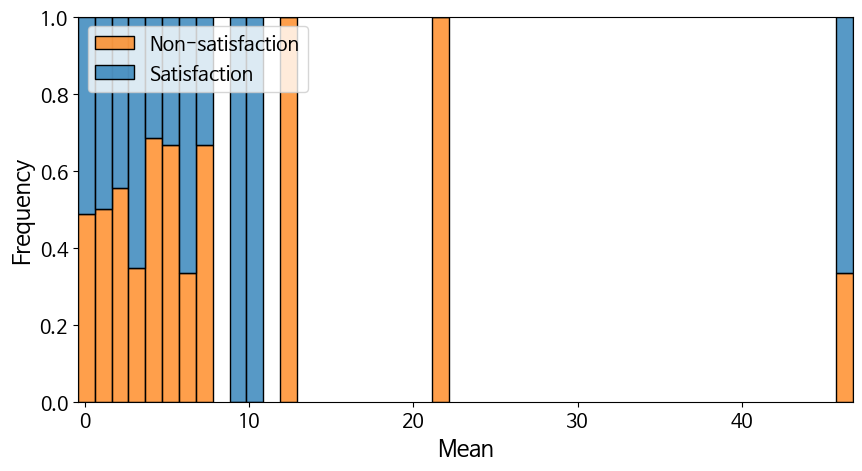

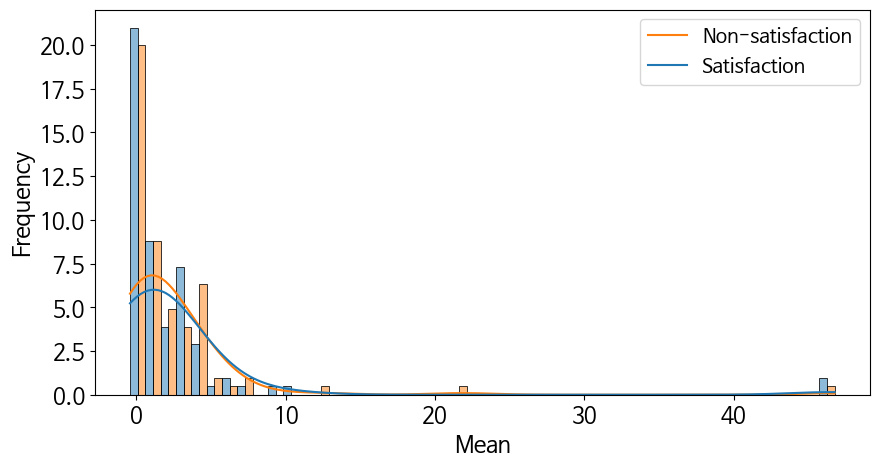

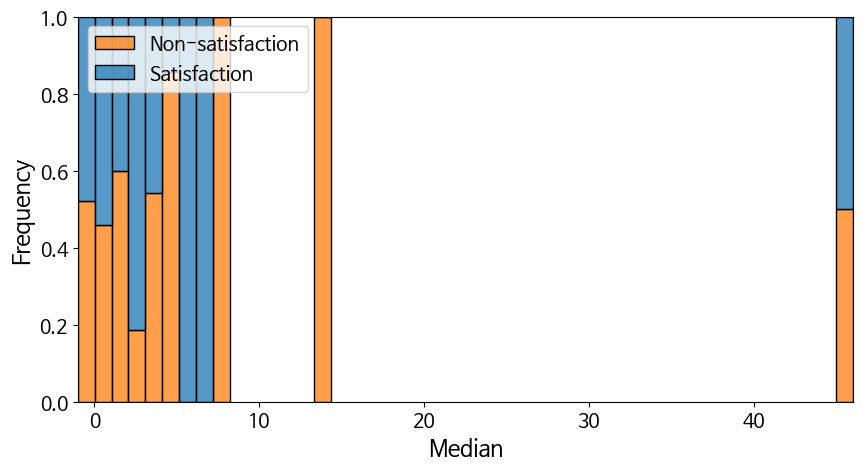

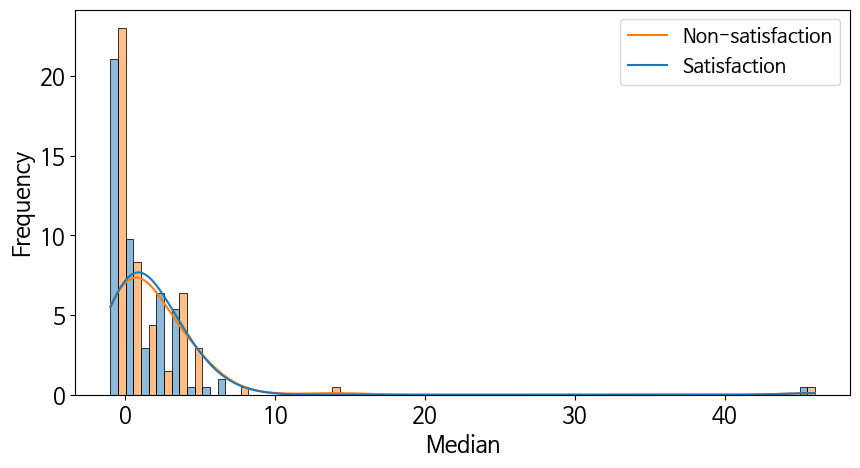

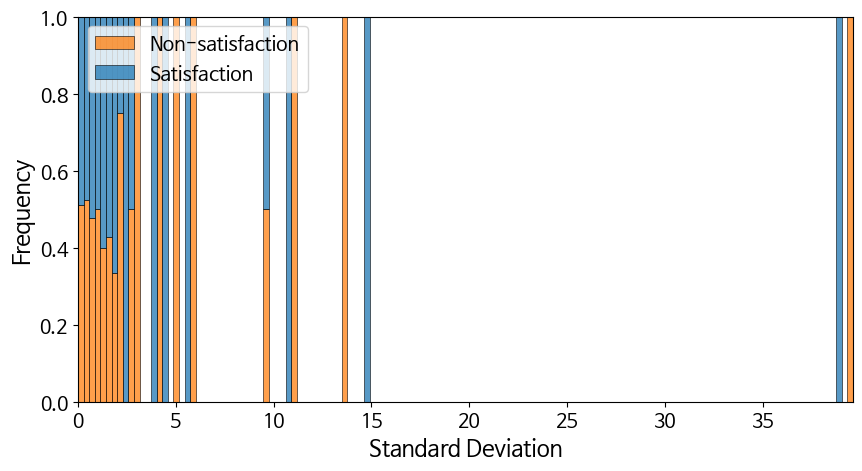

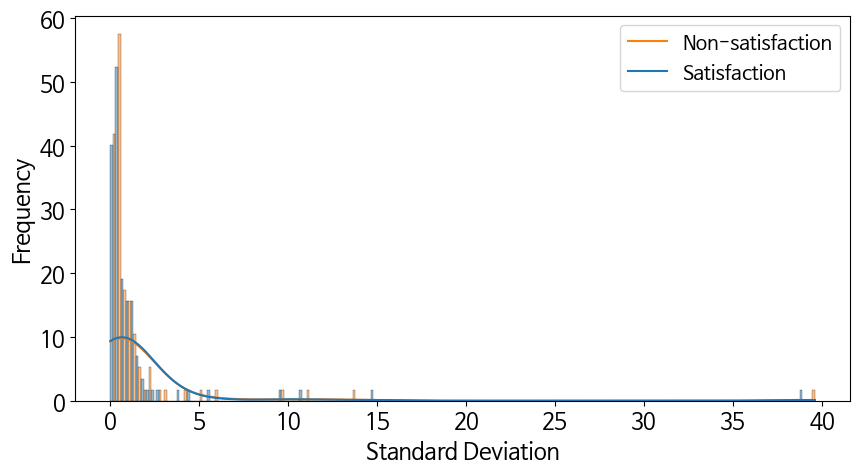

Number of significant features:  64 (0.6464646464646465%)


Non-satisfaction  \
학습 지향 평균                                     1.7500       1 (50.00%)   
                                             2.2500      17 (73.91%)   
                                             2.5000      32 (69.57%)   
                                             2.7500      74 (63.79%)   
                                             3.0000     109 (48.88%)   
...                                                              ...   
문C1) 앞으로 참여하길 희망하는 프로그램은 무엇입니까? (2)성인기초및문해교육 0.0000     862 (10.79%)   
DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_10.0          0.0000     862 (10.78%)   
문C1) 앞으로 참여하길 희망하는 프로그램은 무엇입니까? (2)성인기초및문해교육 1.0000        1 (9.09%)   
DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_10.0          1.0000       1 (16.67%)   
DQ7. 귀하의 주된 소득원천은 무엇입니까?_6                   0.0000     863 (10.79%)   

                                                      Satisfaction  \
학습 지향 평균                                     1.7500     1 (50.00%)   
                                             2.2500     6 (26.09%)   
                                             2.5000    14 (30.43%)   
                                             2.7500    42 (36.21%)   
                                             3.0000   114 (51.12%)   
...                                                            ...   
문C1) 앞으로 참여하길 희망하는 프로그램은 무엇입니까? (2)성인기초및문해교육 0.0000  7126 (89.21%)   
DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_10.0          0.0000  7131 (89.22%)   
문C1) 앞으로 참여하길 희망하는 프로그램은 무엇입니까? (2)성인기초및문해교육 1.0000    10 (90.91%)   
DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_10.0          1.0000     5 (83.33%)   
DQ7. 귀하의 주된 소득원천은 무엇입니까?_6                   0.0000  7135 (89.21%)   

                                                                     Statistics  
학습 지향 평균                                     1.7500  $\chi^2$=1324.61, $p$=0.00  
                                             2.2500                              
                                             2.5000                              
                                             2.7500                              
                                             3.0000                              
...                                                                         ...  
문C1) 앞으로 참여하길 희망하는 프로그램은 무엇입니까? (2)성인기초및문해교육 0.0000     $\chi^2$=0.00, $p$=1.00  
DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_10.0          0.0000     $\chi^2$=0.00, $p$=1.00  
문C1) 앞으로 참여하길 희망하는 프로그램은 무엇입니까? (2)성인기초및문해교육 1.0000                              
DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_10.0          1.0000                              
DQ7. 귀하의 주된 소득원천은 무엇입니까?_6                   0.0000         $T$=-0.35, $p$=0.73  

[619 rows x 3 columns]

Comparison Statistics of X by Y class!
Oversampling...
Ratio of Origin Y:  학습효과성 
1.0000    5721
0.0000     678
Name: count, dtype: int64
Ratio of Sapling Y:  학습효과성 
1.0000    5721
0.0000    5663
Name: count, dtype: int64

Preprocessing of Scaling...
(11384, 99) (11384, 1) 0.0 1.0000000000000002
(1600, 99) (1600, 1) 0.0 1.2077922077922079
Complete!


In [6]:
# Train + Validation Preprocessing
X_train, X_validate, X_colname, \
Y_train, Y_validate = preprocessing_edu(df_train, Y_colname=Y_colname,
                                    X_custom=X_custom, X_dummy=X_dummy, X_reverse=X_reverse, X_delete=X_delete,
                                    test_size=TEST_SIZE, class_stat=CLASS_STAT,
                                    sampling_method=SAMPLING_METHOD, sampling_strategy=SAMPLING_STRATEGY,
                                    scaler=SCALER, random_state=RANDOM_STATE,
                                    label_list=LABEL_LIST)

In [7]:
# Test Preprocessing
X_tr, X_val, X_col, \
Y_tr, Y_val = preprocessing_edu(df_test, Y_colname=Y_colname,
                                    X_custom=X_custom, X_dummy=X_dummy, X_reverse=X_reverse, X_delete=X_delete,
                                    test_size=TEST_SIZE, class_stat=not CLASS_STAT,
                                    sampling_method=None, sampling_strategy=SAMPLING_STRATEGY,
                                    scaler=SCALER, random_state=RANDOM_STATE,
                                    label_list=LABEL_LIST)
X_train, X_validate, X_test = feature_columns_mapping(pd.DataFrame(X_train, columns=X_colname),
                                                      pd.DataFrame(X_validate, columns=X_colname), 
                                                      pd.DataFrame(np.concatenate((X_tr, X_val), axis=0), columns=X_col))
X_colname = list(X_validate.columns)
X_train, X_validate, X_test = X_train.values, X_validate.values, X_test.values


Preprocessing for Data Prepare...
Initial Shape:  (33252, 368)

Deleting Non-meaning Variables...
Shape:  (33252, 339)

Preprocessing NAN...
Column Deleting...
These  86.13569321533923 %( 292 ) columns are containing more than  50.0 % null values!: ['문A2-1) 프로그램 유형__(1)학위취득을 위한 교육_1', '문A2-6) 연간참여시간__(1)학위취득을 위한 교육_1', '문A2-7) 자기부담학습비__(1)학위취득을 위한 교육_1', '문A1-2) 참여한 프로그램 수는 몇개입니까? (2) 성인기초 및 문자해득교육(문해교육)', '문A1-2) 참여한 프로그램 수는 몇개입니까? (3) 직업능력향상교육', '문A1-2) 참여한 프로그램 수는 몇개입니까? (5) 문화예술스포츠교육', '문A1-2) 참여한 프로그램 수는 몇개입니까? (6) 시민참여교육', '문A1-2) 참여한 프로그램 수는 몇개입니까? (4) 인문교양교육', '문A2-5) 참여목적__(1)학위취득을 위한 교육_1', '문A2-1) 프로그램 유형__(2)성인기초 및 문자해득교육_1', '문A2-2) 프로그램 형태__(2)성인기초 및 문자해득교육_1', '문A2-3) 기관 유형__(2)성인기초 및 문자해득교육_1', '문A2-5) 참여목적__(2)성인기초 및 문자해득교육_1', '문A2-6) 연간참여시간__(2)성인기초 및 문자해득교육_1', '문A2-7) 자기부담학습비__(2)성인기초 및 문자해득교육_1', '문A2-8) 학습비 외부 지원여부__(2)성인기초 및 문자해득교육_1', '문A2-9) 학습비 외부 지원기관__(2)성인기초 및 문자해득교육_1', '문A2-10) 프로그램만족도__(2)성인기초 및 문자해득교육_1', '문A2-11) 프로그램 불만족 요인(중복응답)__(2)성인기초 및 문자해득교육_1

  0%|          | 0/9 [00:00<?, ?it/s]


Shape of Data:  (33252, 46)
Complete of fillna!
Shape:  (33252, 46)
Dummy Feature Generating...


  0%|          | 0/6 [00:00<?, ?it/s]

Shape:  (33252, 73)

Object X Features:  []
Complete X Object Processing!
(10011, 72) (10011, 1)
(2503, 72) (2503, 1)
Data Split!
Comparison Statistics of X by Y class!

Preprocessing of Scaling...
(10011, 72) (10011, 1) 0.0 1.0000000000000002
(2503, 72) (2503, 1) 0.0 1.0000000000000002
Complete!


# Modeling

## Machine Learning

Learning...:  2025-10-02 21:10:56.615473


  0%|          | 0/100 [00:00<?, ?it/s]

Best Metric Score:  0.9447242861640465
Best Tuning Parameters:  {'solver': 'saga', 'penalty': 'l2', 'C': 12.614021803548292, 'class_weight': 'balanced', 'max_iter': 1556, 'random_state': 123, 'multi_class': 'auto'}

Explanations...:  2025-10-02 21:21:28.208228
Explanations of Y:


,Features,Coef,Features,Coef
0,DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_11.0,7.5568,문A1-2) 참여한 프로그램 수는 몇개입니까? (4) 인문교양교육,-4.4189
1,학습 지향 평균,6.0969,취업구분,-2.0497
2,DQ6. 귀하께서는 건강에 자신 있습니까?_1,6.0009,DQ8. 귀하께서는 현재 수입을 목적으로 일하고 계십니까?,-2.0497
3,DQ7. 귀하의 주된 소득원천은 무엇입니까?_5,5.7663,문A2-1) 프로그램 유형__(3)직업능력향상교육_1,-1.8166
4,DQ6. 귀하께서는 건강에 자신 있습니까?_2,5.4797,문A2-6) 연간참여시간__(3)직업능력향상교육_1,-1.5917
5,DQ6. 귀하께서는 건강에 자신 있습니까?_3,5.4555,DQ3. 몇 명과 함께 지내고 있습니까?__명,-1.5337
6,DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_6.0,5.3792,취약계층,-1.4647
7,DQ7. 귀하의 주된 소득원천은 무엇입니까?_4,4.9588,문A1-2) 참여한 프로그램 수는 몇개입니까? (6) 시민참여교육,-1.3550
8,DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_9.0,4.9128,문A2-8) 학습비 외부 지원여부__(3)직업능력향상교육_1,-1.1973
9,DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_7.0,4.9076,문D1-1) 귀하께서는 평생교육 프로그램 관련 정보를 어떻게 얻으셨습니까? (중복응답)1,-0.7763


Performance Evaluations...:  2025-10-02 21:21:28.217310
Performance: 


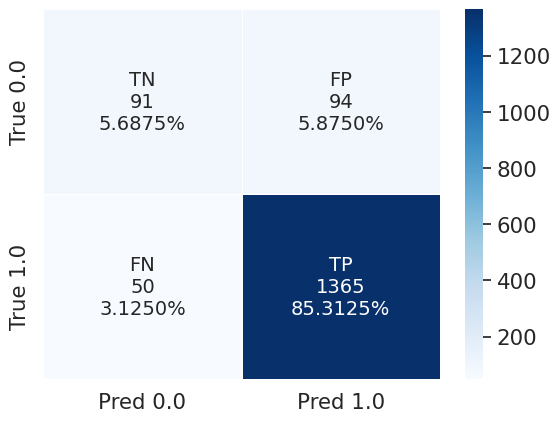

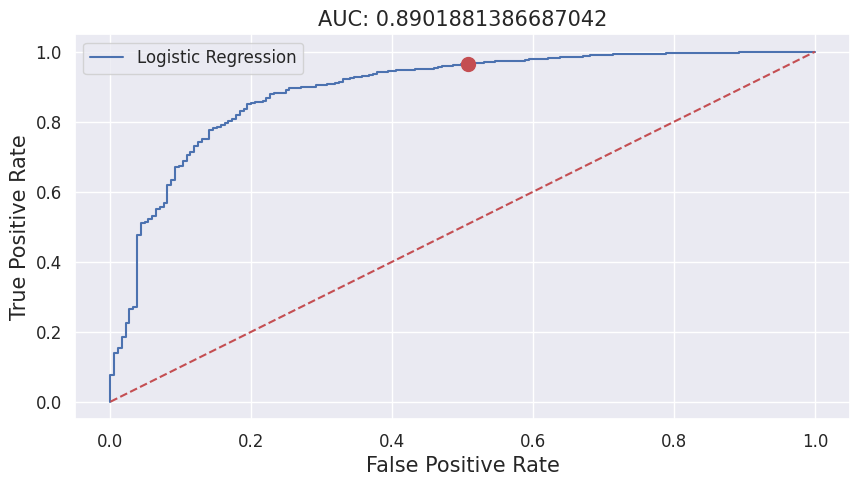

LogisticRegression(C=12.614021803548292, class_weight='balanced', max_iter=1556,
                   random_state=123, solver='saga')

,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Test set,1600,1365,91,94,50,0.9356,0.9647,0.4919,0.9499,0.9100,0.7283,0.8902


,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Entire population,12984,6885,5346,502,251,0.9320,0.9648,0.9142,0.9482,0.9420,0.9395,0.9832


In [8]:
model_lr, Score_te_lr, Score_trte_lr = modeling_LogisticRegression(X_train, Y_train, X_validate, Y_validate, 
                                                             X_colname=X_colname, 
                                                             tune_trials=TUNE_TRIALS,
                                                             cv_splits=CV_SPLITS,
                                                             tune_metric=TUNE_METRIC,
                                                             shap=not SHAP, 
                                                             X_top_display=X_TOP_DISPLAY, 
                                                             dependency=DEPENDENCY,
                                                             label_list=LABEL_LIST)
display(model_lr, Score_te_lr, Score_trte_lr)

Learning...:  2025-10-02 21:21:28.859940


  0%|          | 0/100 [00:00<?, ?it/s]

Best Metric Score:  0.9681053399646766
Best Tuning Parameters:  {'n_estimators': 700, 'max_depth': None, 'max_features': 'log2', 'min_samples_split': 3, 'min_samples_leaf': 1, 'bootstrap': False, 'random_state': 123, 'n_jobs': -1, 'class_weight': 'balanced_subsample'}

Explanations...:  2025-10-02 21:32:53.369526
Explanations of Y:


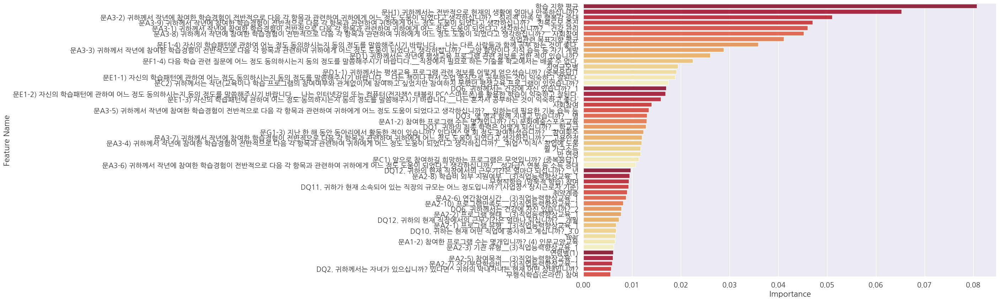

Performance Evaluations...:  2025-10-02 21:32:54.090035
Performance: 


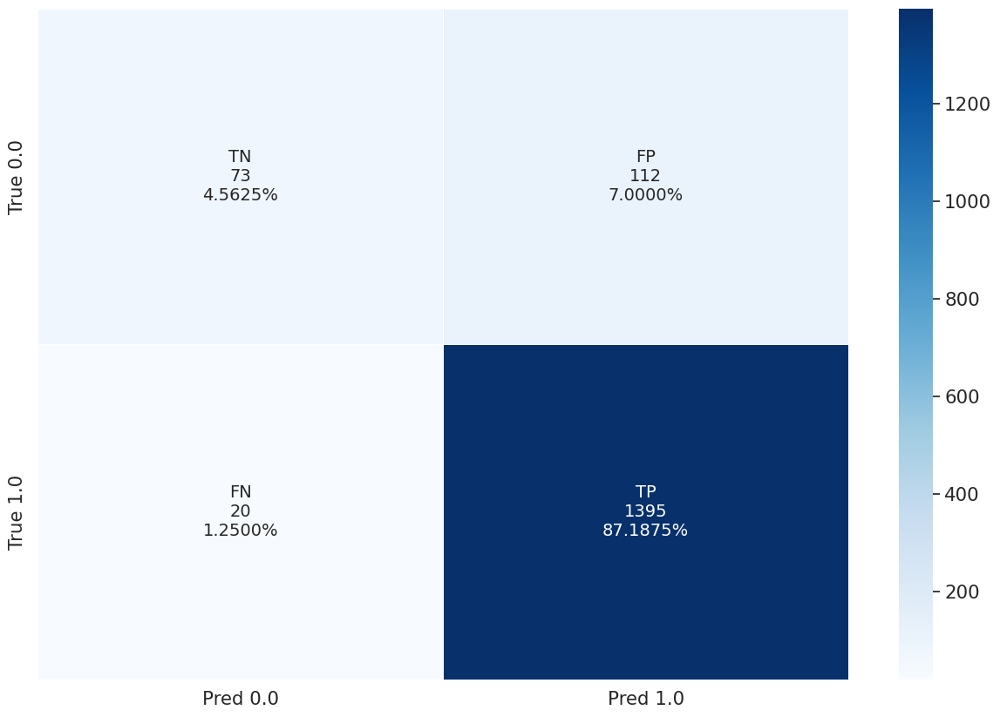

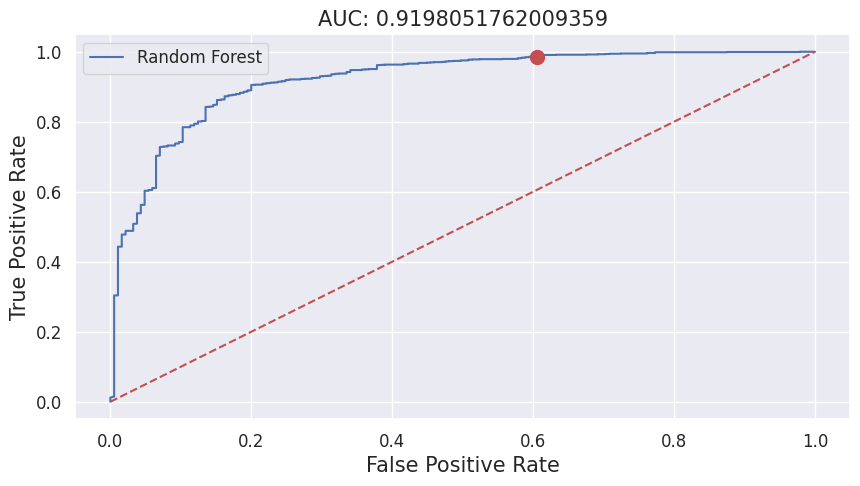

RandomForestClassifier(bootstrap=False, class_weight='balanced_subsample',
                       max_features='log2', min_samples_split=3,
                       n_estimators=700, n_jobs=-1, random_state=123)

,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Test set,1600,1395,73,112,20,0.9257,0.9859,0.3946,0.9548,0.9175,0.6902,0.9198


,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Entire population,12984,7116,5736,112,20,0.9845,0.9972,0.9808,0.9908,0.9898,0.9890,0.9994


In [9]:
model_rf, Score_te_rf, Score_trte_rf = modeling_RandomForestClassifier(X_train, Y_train, X_validate, Y_validate, 
                                                             X_colname=X_colname, 
                                                             tune_trials=TUNE_TRIALS,
                                                             cv_splits=CV_SPLITS,
                                                             tune_metric=TUNE_METRIC,
                                                             shap=not SHAP, 
                                                             X_top_display=X_TOP_DISPLAY, 
                                                             dependency=DEPENDENCY,
                                                             label_list=LABEL_LIST)
display(model_rf, Score_te_rf, Score_trte_rf)

Learning...:  2025-10-02 21:32:54.938601


  0%|          | 0/100 [00:00<?, ?it/s]

Best Metric Score:  0.9650909617785428
Best Tuning Parameters:  {'n_estimators': 950, 'max_depth': 10, 'learning_rate': 0.014388404257053015, 'subsample': 0.7099935853845472, 'colsample_bytree': 0.7044195539871351, 'min_child_weight': 2.646336879013928, 'reg_alpha': 0.0005754436333209185, 'reg_lambda': 0.0012088958577459407, 'random_state': 123, 'n_jobs': -1, 'tree_method': 'hist', 'verbosity': 0, 'scale_pos_weight': 3.1103855443630026}

Explanations...:  2025-10-02 21:43:24.034572
Explanations of Y:


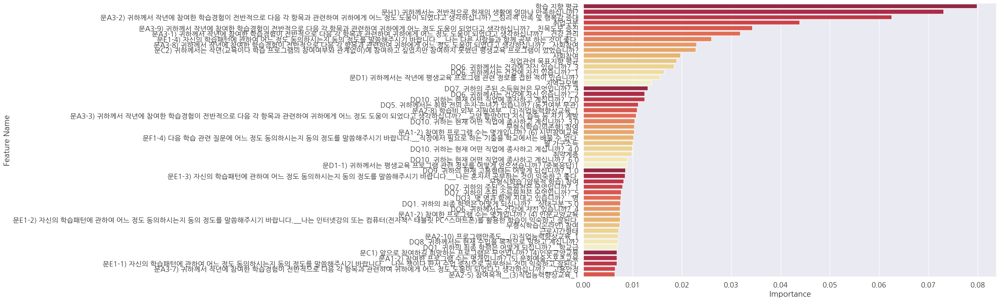

Performance Evaluations...:  2025-10-02 21:43:24.387137
Performance: 


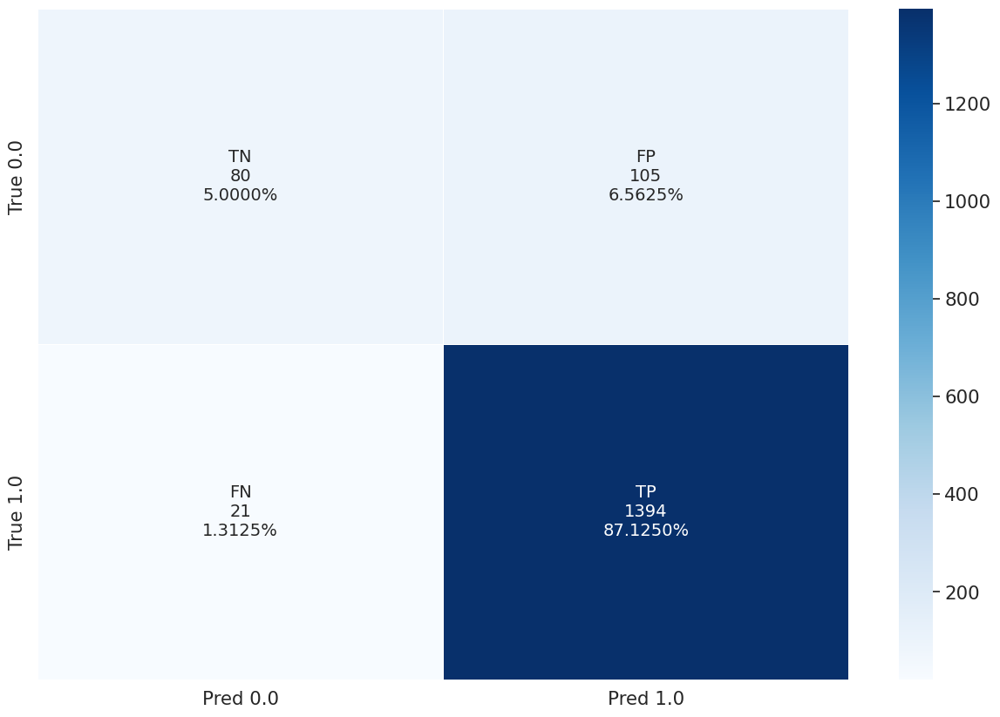

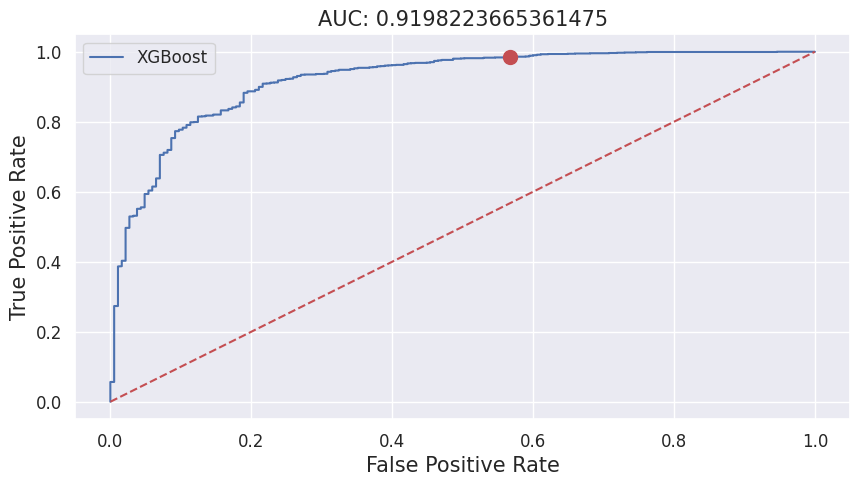

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7044195539871351, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, feature_weights=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.014388404257053015,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=2.646336879013928, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=950,
              n_jobs=-1, num_parallel_tree=None, ...)

,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Test set,1600,1394,80,105,21,0.9300,0.9852,0.4324,0.9568,0.9213,0.7088,0.9198


,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Entire population,12984,7115,5738,110,21,0.9848,0.9971,0.9812,0.9909,0.9899,0.9891,0.9983


In [10]:
model_xgb, Score_te_xgb, Score_trte_xgb = modeling_XGBClassifier(X_train, Y_train, X_validate, Y_validate, 
                                                             X_colname=X_colname, 
                                                             tune_trials=TUNE_TRIALS,
                                                             cv_splits=CV_SPLITS,
                                                             tune_metric=TUNE_METRIC,
                                                             shap=not SHAP, 
                                                             X_top_display=X_TOP_DISPLAY, 
                                                             dependency=DEPENDENCY,
                                                             label_list=LABEL_LIST)
display(model_xgb, Score_te_xgb, Score_trte_xgb)

Learning...:  2025-10-02 21:43:24.757118


  0%|          | 0/100 [00:00<?, ?it/s]

Best Metric Score:  0.9666621223438376
Best Tuning Parameters:  {'n_estimators': 650, 'learning_rate': 0.019427918945056886, 'num_leaves': 249, 'max_depth': 21, 'min_child_samples': 5, 'subsample': 0.6146069670753995, 'colsample_bytree': 0.9168869357314777, 'reg_alpha': 4.758119836155798e-07, 'reg_lambda': 2.3261601699718522e-05, 'random_state': 123, 'n_jobs': -1, 'class_weight': 'balanced'}

[LightGBM] [Info] Number of positive: 5721, number of negative: 5663
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002089 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 9113
[LightGBM] [Info] Number of data points in the train set: 11384, number of used features: 96
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000
Explanations...:  2025-10-02 22:59:24.052955
Explanations of Y:


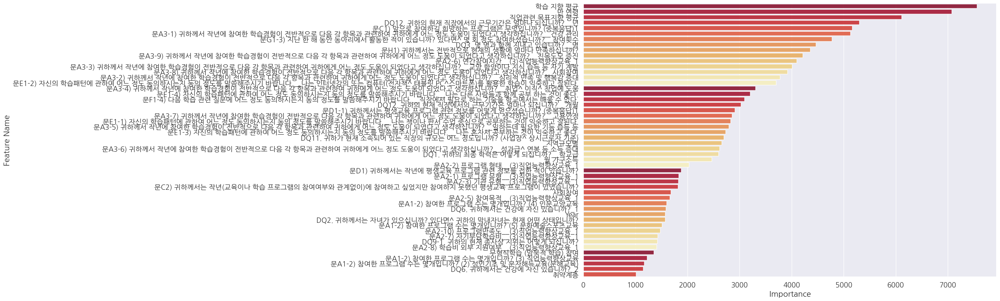

Performance Evaluations...:  2025-10-02 22:59:24.707764
Performance: 


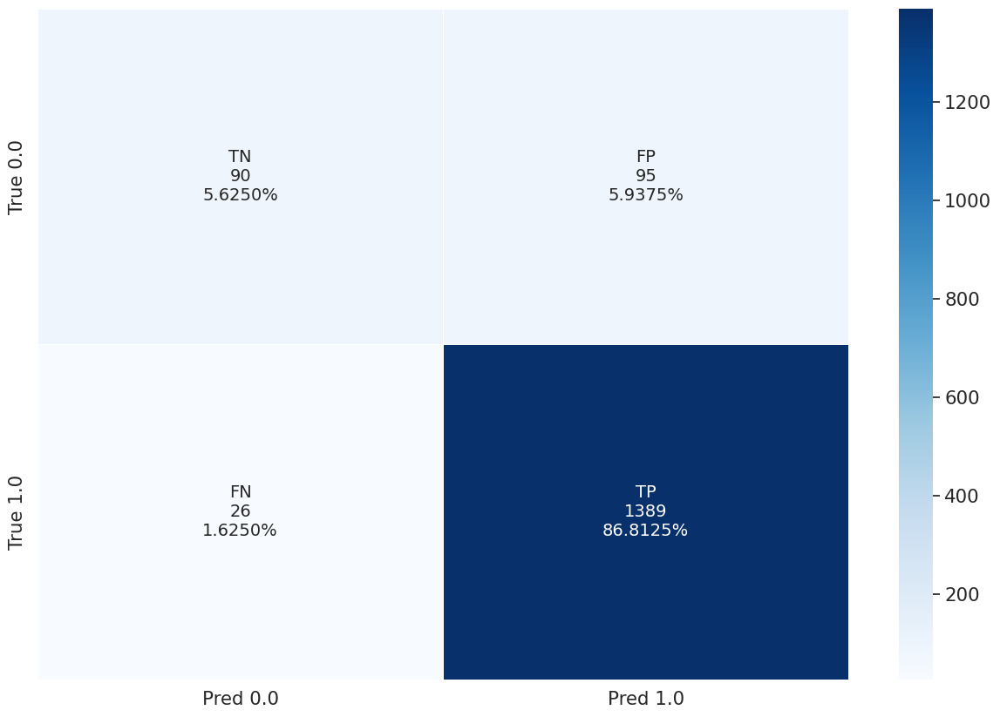

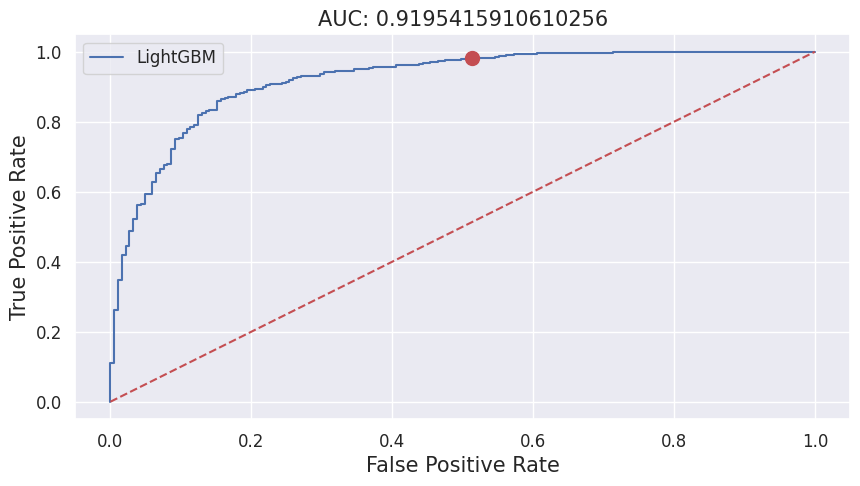

LGBMClassifier(class_weight='balanced', colsample_bytree=0.9168869357314777,
               learning_rate=0.019427918945056886, max_depth=21,
               min_child_samples=5, n_estimators=650, n_jobs=-1, num_leaves=249,
               random_state=123, reg_alpha=4.758119836155798e-07,
               reg_lambda=2.3261601699718522e-05, subsample=0.6146069670753995)

,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Test set,1600,1389,90,95,26,0.9360,0.9816,0.4865,0.9583,0.9244,0.7341,0.9195


,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Entire population,12984,7110,5753,95,26,0.9868,0.9964,0.9838,0.9916,0.9907,0.9901,0.9988


In [11]:
model_lgbm, Score_te_lgbm, Score_trte_lgbm = modeling_LGBMClassifier(X_train, Y_train, X_validate, Y_validate, 
                                                             X_colname=X_colname, 
                                                             tune_trials=TUNE_TRIALS,
                                                             cv_splits=CV_SPLITS,
                                                             tune_metric=TUNE_METRIC,
                                                             shap=not SHAP, 
                                                             X_top_display=X_TOP_DISPLAY, 
                                                             dependency=DEPENDENCY,
                                                             label_list=LABEL_LIST)
display(model_lgbm, Score_te_lgbm, Score_trte_lgbm)

Learning...:  2025-10-02 22:59:25.388517


  0%|          | 0/100 [00:00<?, ?it/s]

Best Metric Score:  0.9656303126989432
Best Tuning Parameters:  {'iterations': 450, 'depth': 10, 'learning_rate': 0.09822309401916318, 'l2_leaf_reg': 2.4721804719737848, 'subsample': 0.7863332266273481, 'random_state': 123, 'verbose': 0, 'allow_writing_files': False}

Explanations...:  2025-10-02 23:39:49.089117
Explanations of Y:


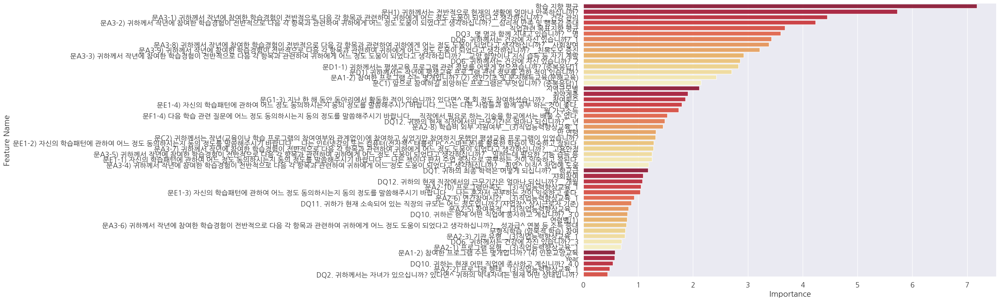

Performance Evaluations...:  2025-10-02 23:39:49.440590
Performance: 


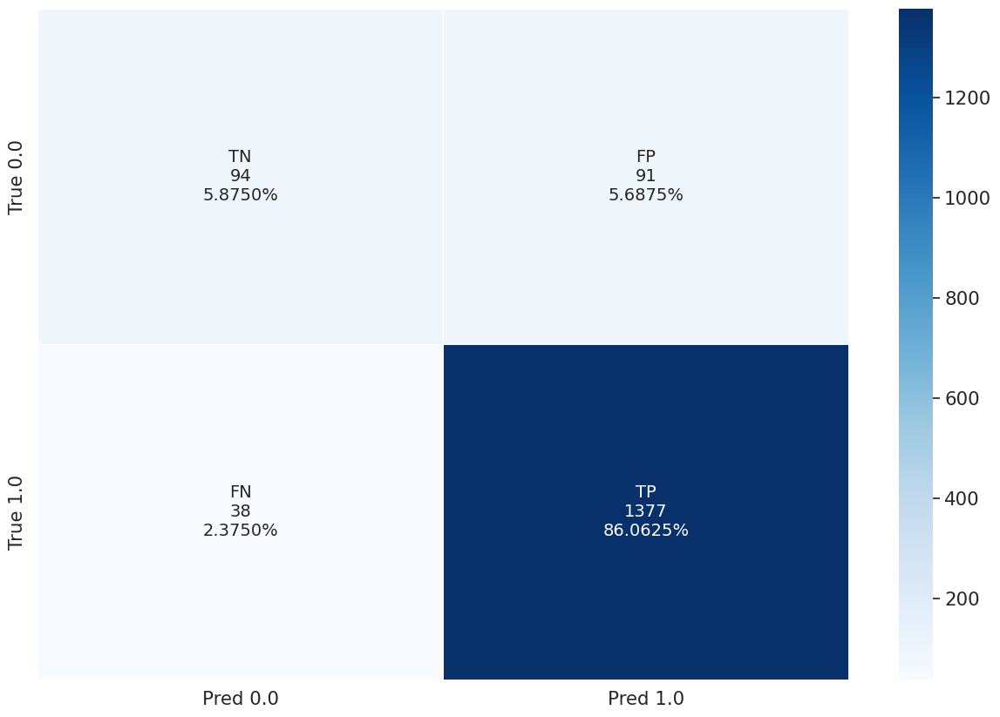

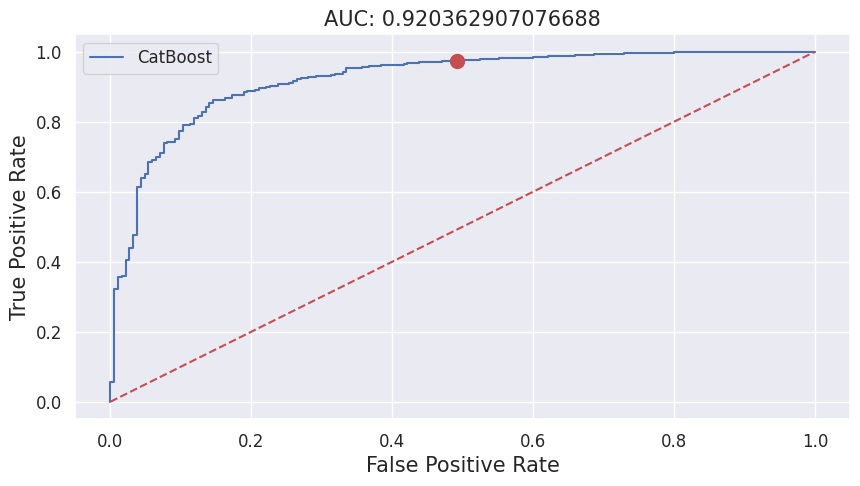

,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Test set,1600,1377,94,91,38,0.9380,0.9731,0.5081,0.9553,0.9194,0.7406,0.9204


,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Entire population,12984,7098,5757,91,38,0.9873,0.9947,0.9844,0.9910,0.9901,0.9896,0.9986


In [12]:
model_catb, Score_te_catb, Score_trte_catb = modeling_CatBoostClassifier(X_train, Y_train, X_validate, Y_validate, 
                                                             X_colname=X_colname, 
                                                             tune_trials=TUNE_TRIALS,
                                                             cv_splits=CV_SPLITS,
                                                             tune_metric=TUNE_METRIC,
                                                             shap=not SHAP, 
                                                             X_top_display=X_TOP_DISPLAY, 
                                                             dependency=DEPENDENCY,
                                                             label_list=LABEL_LIST)
display(model_catb, Score_te_catb, Score_trte_catb)

## Deep Learning

### MLP

  0%|          | 0/100 [00:00<?, ?it/s]

Training Progress: 100%|████████████████████████████████████████████████████████████████| 50/50 [01:11<00:00,  1.44s/it]


Best Metric Score:  0.991627037525177
Best Tuning Parameters:  {'hidden_activation': 'relu', 'dropout': 0.00011558822585812541, 'learning_rate': 0.0005796918167813341, 'batch_size': 32}

356/356 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Performance: 


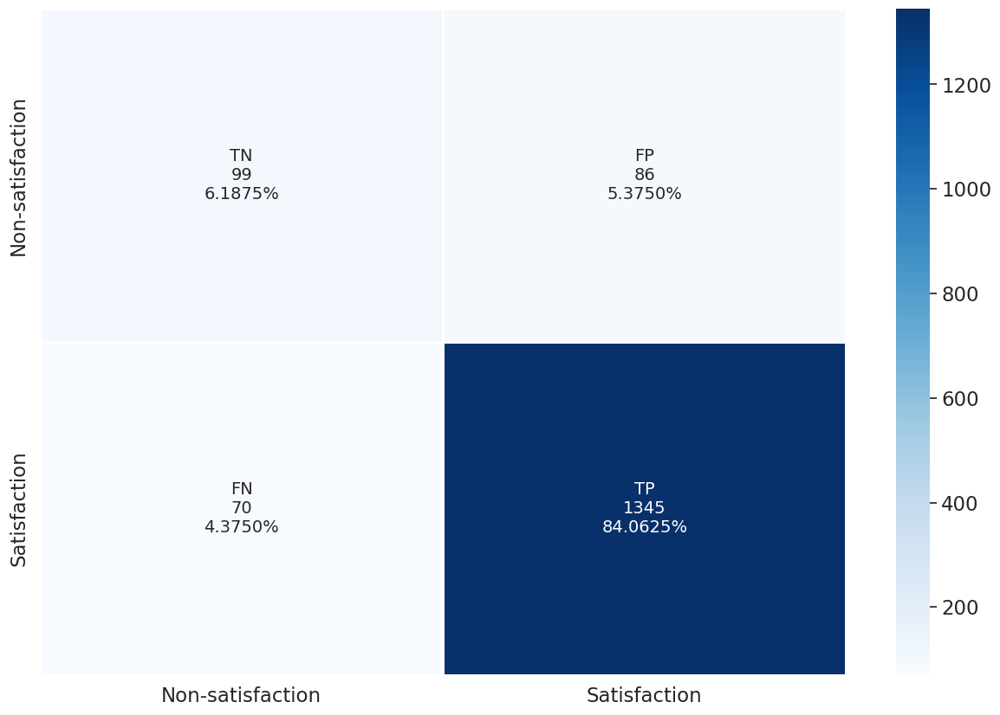

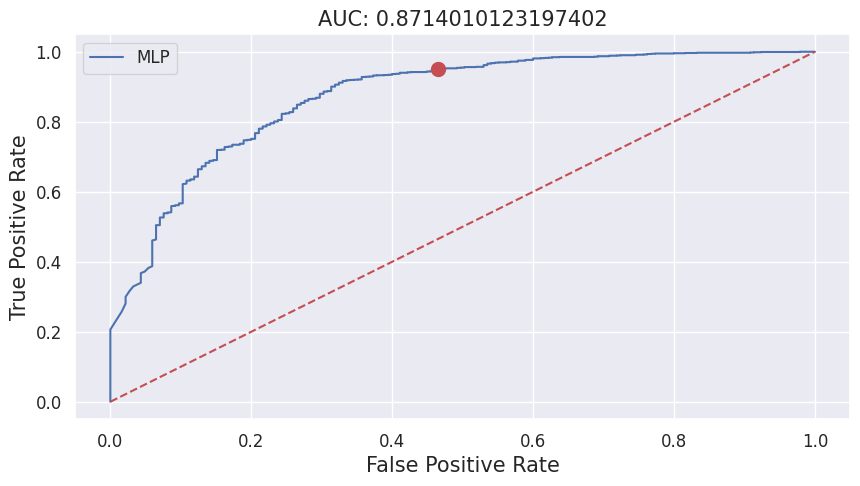

<Functional name=functional_109, built=True>

,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Test set,1600,1345,99,86,70,0.9399,0.9505,0.5351,0.9452,0.9025,0.7428,0.8714


,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Entire population,12984,7054,5731,117,82,0.9837,0.9885,0.9800,0.9861,0.9847,0.9843,0.9963


In [36]:
# Reshape
if WEIGHT_METHOD != None:
    Y_train_dl, Y_validate_dl = reshape_YtoOneHot(Y_train, Y_validate)
else:
    Y_train_dl, Y_validate_dl = Y_train.copy(), Y_validate.copy()
X_train_dl, X_validate_dl = X_train.copy(), X_validate.copy()
if VALIDATION_SPLIT == None:
    VALIDATION_DATA = (X_validate_dl, Y_validate_dl)

# MLP with Hyperparameter Tuning
ALGO_NAME='MLP'
model_mlp, best_params_mlp = modeling_DLHyperOptimization(
    X_train_dl, Y_train_dl,
    model_keras=lambda TUNE_TRIALS, X, Y: modeling_MLP(X, Y, 
                                                       node_MLP=NODE_MLP, 
                                                       weight_method=WEIGHT_METHOD,
                                                       trial=TUNE_TRIALS),
    validation_split=VALIDATION_SPLIT,
    validation_data=VALIDATION_DATA,
    epochs=EPOCHS,
    tune_trials=TUNE_TRIALS,
    tune_metric=TUNE_METRIC_DL,
    random_state=RANDOM_STATE
)

# Performance Evaluation
Score_te_mlp, Score_trte_mlp = prediction_class(model_mlp, X_train_dl, Y_train_dl, X_validate_dl, Y_validate_dl,
                                                LABEL_LIST=LABEL_LIST, ALGO_NAME=ALGO_NAME)
display(model_mlp, Score_te_mlp, Score_trte_mlp)

In [33]:
# # 재학습 및 예측
# ## Train 갱신
# X_train_all = np.concatenate([X_train_dl, X_validate_dl], axis=0)
# Y_train_all = np.concatenate([Y_train_dl, Y_validate_dl], axis=0)
# ## 모델 하이퍼파라미터 갱신
# model_refit_mlp = modeling_MLP(X_train_all, Y_train_all,
#                                node_MLP=NODE_MLP,
#                                weight_method=WEIGHT_METHOD,
#                                best_params=best_params_mlp)
# ## 학습 갱신
# model_refit_mlp.fit(X_train_all, Y_train_all, 
#                     batch_size=best_params_mlp.get('batch_size'),
#                     epochs=EPOCHS,
#                     verbose=1)
# ## 예측
# np.unique(model_refit_mlp.predict(X_test) >=0.5, return_counts=True)

Epoch 1/5
203/203 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - AUC: 0.7642 - Accuracy: 0.0024 - F1-score: 0.6993 - loss: 0.4692
Epoch 2/5
203/203 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - AUC: 0.9301 - Accuracy: 0.0199 - F1-score: 0.8592 - loss: 0.2758
Epoch 3/5
203/203 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9455 - Accuracy: 0.0403 - F1-score: 0.8787 - loss: 0.2637
Epoch 4/5
203/203 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9512 - Accuracy: 0.0514 - F1-score: 0.8872 - loss: 0.2505
Epoch 5/5
203/203 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9553 - Accuracy: 0.0616 - F1-score: 0.8930 - loss: 0.2435
392/392 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step


(array([False,  True]), array([12514, 12514]))

### CNN

X_train_reshape: (11384, 99) --> (11384, 99, 1)
X_test_reshape: (1600, 99) --> (1600, 99, 1)


  0%|          | 0/100 [00:00<?, ?it/s]

Training Progress: 100%|████████████████████████████████████████████████████████████████| 50/50 [01:11<00:00,  1.43s/it]


Best Metric Score:  0.992148756980896
Best Tuning Parameters:  {'kernel_size': 5, 'stride': 1, 'pool_size': 2, 'pool_stride': 2, 'hidden_activation': 'selu', 'dropout': 0.011040928905178632, 'learning_rate': 0.00019903035519679526, 'batch_size': 32}

356/356 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
Performance: 


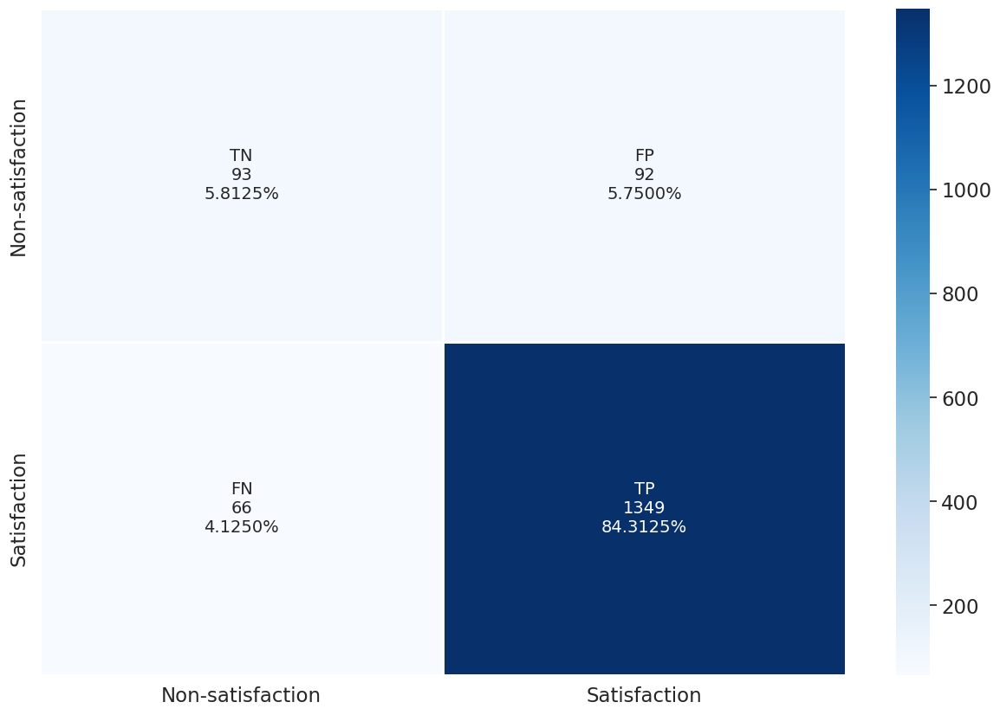

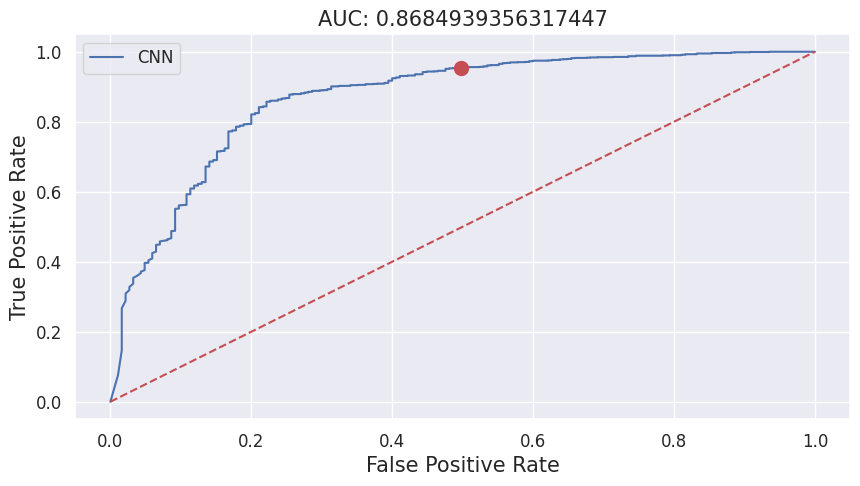

<Functional name=functional_270, built=True>

,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Test set,1600,1349,93,92,66,0.9362,0.9534,0.5027,0.9447,0.9012,0.7280,0.8685


,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
Entire population,12984,7059,5738,110,77,0.9847,0.9892,0.9812,0.9869,0.9856,0.9852,0.9965


In [38]:
# Reshape
if WEIGHT_METHOD != None:
    Y_train_dl, Y_validate_dl = reshape_YtoOneHot(Y_train, Y_validate)
else:
    Y_train_dl, Y_validate_dl = Y_train.copy(), Y_validate.copy()
X_train_dl, X_validate_dl = reshape_X2Dto3D(X_train, X_validate)
if VALIDATION_SPLIT == None:
    VALIDATION_DATA = (X_validate_dl, Y_validate_dl)

# CNN with Hyperparameter Tuning
ALGO_NAME='CNN'
model_cnn, best_params_cnn = modeling_DLHyperOptimization(
    X_train_dl, Y_train_dl,
    model_keras=lambda TUNE_TRIALS, X, Y: modeling_CNN1D(X, Y, 
                                                         node_CNN1=NODE_CNN1, node_CNN2=NODE_CNN2,
                                                         weight_method=WEIGHT_METHOD,
                                                         trial=TUNE_TRIALS),
    validation_split=VALIDATION_SPLIT,
    validation_data=VALIDATION_DATA,
    epochs=EPOCHS,
    tune_trials=TUNE_TRIALS,
    tune_metric=TUNE_METRIC_DL,  
    random_state=RANDOM_STATE
)

# Performance Evaluation
Score_te_cnn, Score_trte_cnn = prediction_class(model_cnn, X_train_dl, Y_train_dl, X_validate_dl, Y_validate_dl,
                                                LABEL_LIST=LABEL_LIST, ALGO_NAME=ALGO_NAME)
display(model_cnn, Score_te_cnn, Score_trte_cnn)

In [19]:
# # 재학습 및 예측
# ## Train 갱신
# X_train_all = np.concatenate([X_train_dl, X_validate_dl], axis=0)
# Y_train_all = np.concatenate([Y_train_dl, Y_validate_dl], axis=0)
# ## 모델 하이퍼파라미터 갱신
# model_refit_cnn = modeling_CNN1D(X_train_all, Y_train_all,
#                                node_CNN1=NODE_CNN1, node_CNN2=NODE_CNN2,
#                                  weight_method=WEIGHT_METHOD,
#                                best_params=best_params_cnn)
# ## 학습 갱신
# model_refit_cnn.fit(X_train_all, Y_train_all, 
#                     batch_size=best_params_cnn.get('batch_size'),
#                     epochs=EPOCHS,
#                     verbose=1)
# ## 예측
# np.unique(model_refit_cnn.predict(X_test) >=0.5, return_counts=True)

Epoch 1/20
406/406 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step - AUC: 0.7081 - Accuracy: 0.0000e+00 - F1-score: 0.6960 - loss: 0.4723
Epoch 2/20
406/406 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - AUC: 0.9365 - Accuracy: 0.0000e+00 - F1-score: 0.7089 - loss: 0.2146
Epoch 3/20
406/406 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9532 - Accuracy: 0.0000e+00 - F1-score: 0.7112 - loss: 0.1987
Epoch 4/20
406/406 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - AUC: 0.9608 - Accuracy: 0.0000e+00 - F1-score: 0.7219 - loss: 0.1763
Epoch 5/20
406/406 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9655 - Accuracy: 0.0000e+00 - F1-score: 0.7314 - loss: 0.1685
Epoch 6/20
406/406 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9688 - Accuracy: 0.0000e+00 - F1-score: 0.7384 - loss: 0.1629
Epoch 7/20
406/406 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9710 - Accuracy: 0.0000e+00 - F1-score: 0.7433 - loss: 0.1638
Epoch 8/20
406/406 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - AUC: 0.9727 - Accuracy: 0.0000e+00 - F1-score: 0.7486 - loss: 0.1575
Epoch 9/20
406/

# Summary

## Best Model Saving

In [114]:
# Saving_ModelBestParams(model_lr)
# Saving_ModelBestParams(model_rf)
# Saving_ModelBestParams(model_xgb)
# Saving_ModelBestParams(model_lgbm)
# Saving_ModelBestParams(model_catb)
# Saving_ModelBestParams(model_mlp, algo_name='MLP')
# Saving_ModelBestParams(model_cnn, algo_name='CNN')

LogisticRegression
Best Params Location: ./Model/best_params_20251005_003825_LogisticRegression.json
Best Model Location: ./Model/best_model_20251005_003825_LogisticRegression.joblib

RandomForestClassifier
Best Params Location: ./Model/best_params_20251005_003825_RandomForestClassifier.json
Best Model Location: ./Model/best_model_20251005_003825_RandomForestClassifier.joblib

XGBClassifier
Best Params Location: ./Model/best_params_20251005_003825_XGBClassifier.json
Best Model Location: ./Model/best_model_20251005_003825_XGBClassifier.json

LGBMClassifier
Best Params Location: ./Model/best_params_20251005_003825_LGBMClassifier.json
Best Model Location: ./Model/best_model_20251005_003825_LGBMClassifier.txt

CatBoostClassifier
Best Params Location: ./Model/best_params_20251005_003825_CatBoostClassifier.json
Best Model Location: ./Model/best_model_20251005_003825_CatBoostClassifier.cbm

MLP
Best Params Location: None
Best Model Location: ./Model/best_model_20251005_003825_MLP.keras

CNN
B

## Performance Summary

In [108]:
# Score Summary
folder_location = os.path.join(os.getcwd(),'Result')
Scores = prediction_summary(folder_location=folder_location, 
                            # algonames=['Logistic Regression', 'Random Forest', 'XGBoost', 'LGBM', 'CatBoost'])
                            algonames=['Logistic Regression', 'Random Forest', 'XGBoost', 'LGBM', 'CatBoost', 'MLP', 'CNN'])

# Final Model
Score_Test = Scores[Scores.Dataset == 'Test set']
Score_Test.loc[Score_Test[METRIC_FINAL].idxmax(), 'Algorithm']

,Dataset,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Test set,Logistic Regression,1600,1365,91,94,50,0.935572,0.964664,0.491892,0.949896,0.910000,0.728278,0.890188
1,Test set,Random Forest,1600,1395,73,112,20,0.925680,0.985866,0.394595,0.954825,0.917500,0.690230,0.919805
2,Test set,XGBoost,1600,1394,80,105,21,0.929953,0.985159,0.432432,0.956760,0.921250,0.708796,0.919822
3,Test set,LGBM,1600,1375,94,91,40,0.937926,0.971731,0.508108,0.954530,0.918125,0.739920,0.918208
4,Test set,CatBoost,1600,1377,94,91,38,0.938011,0.973145,0.508108,0.955255,0.919375,0.740626,0.920363
5,Test set,MLP,1600,1345,99,86,70,0.939902,0.950530,0.535135,0.945186,0.902500,0.742833,0.871401
6,Test set,CNN,1600,1349,93,92,66,0.936155,0.953357,0.502703,0.944678,0.901250,0.728030,0.868494


,Dataset,Algorithm,N,True Positive,True Negative,False Positive,False Negative,Precision,Recall,Specificity,F1-score,Accuracy,Balanced Accuracy,AUC
0,Entire population,Logistic Regression,12984,6885,5346,502,251,0.932043,0.964826,0.914159,0.948151,0.942006,0.939492,0.983209
1,Entire population,Random Forest,12984,7116,5736,112,20,0.984505,0.997197,0.980848,0.990810,0.989834,0.989023,0.999400
2,Entire population,XGBoost,12984,7115,5738,110,21,0.984775,0.997057,0.981190,0.990878,0.989911,0.989124,0.998314
3,Entire population,LGBM,12984,7083,5653,195,53,0.973207,0.992573,0.966655,0.982795,0.980900,0.979614,0.997495
4,Entire population,CatBoost,12984,7098,5757,91,38,0.987342,0.994675,0.984439,0.990995,0.990065,0.989557,0.998553
5,Entire population,MLP,12984,7054,5731,117,82,0.983684,0.988509,0.979993,0.986091,0.984673,0.984251,0.996272
6,Entire population,CNN,12984,7059,5738,110,77,0.984656,0.989210,0.981190,0.986928,0.985598,0.985200,0.996500


'XGBoost'

# Explanation

In [14]:
if platform.system() == 'Darwin': #맥
    plt.rc('font', family='AppleGothic') 
elif platform.system() == 'Windows': #윈도우
    # FONT_NAME = 'Malgun Gothic'
    FONT_NAME = 'malgun'
    plt.rc('font', family=FONT_NAME) 
    plt.rcParams['font.family'] = FONT_NAME
    mpl.rc('font', family=FONT_NAME)
    sns.set(font=FONT_NAME) 
    sys_font = font_manager.findSystemFonts()
    FONT_PATHS = [path for path in sys_font if 'malgun' in path]
    if len(FONT_PATHS) != 0:
        rc('font', family=font_manager.FontProperties(fname=FONT_PATHS[0]).get_name())
elif platform.system() == 'Linux':
    FONT_NAME = 'NanumGothic'
    plt.rc('font', family=FONT_NAME) 
    plt.rcParams['font.family'] = FONT_NAME
    mpl.rc('font', family=FONT_NAME)
    sns.set(font=FONT_NAME) 
    sys_font = font_manager.findSystemFonts()
    FONT_PATHS = [path for path in sys_font if 'NanumGothic.ttf' in path]
    if len(FONT_PATHS) != 0:
        rc('font', family=font_manager.FontProperties(fname=FONT_PATHS[0]).get_name())

In [15]:
best_params_location = './Model/best_params_20251005_003825_XGBClassifier.json'
best_model_location = './Model/best_model_20251005_003825_XGBClassifier.json'

with open(best_params_location) as f:
    best_params = json.load(f)
print(best_params)

with open(best_model_location) as f:
    best_model = json.load(f)
print(best_model)

{'objective': 'binary:logistic', 'base_score': None, 'booster': None, 'callbacks': None, 'colsample_bylevel': None, 'colsample_bynode': None, 'colsample_bytree': 0.7044195539871351, 'device': None, 'early_stopping_rounds': None, 'enable_categorical': False, 'eval_metric': None, 'feature_types': None, 'feature_weights': None, 'gamma': None, 'grow_policy': None, 'importance_type': None, 'interaction_constraints': None, 'learning_rate': 0.014388404257053015, 'max_bin': None, 'max_cat_threshold': None, 'max_cat_to_onehot': None, 'max_delta_step': None, 'max_depth': 10, 'max_leaves': None, 'min_child_weight': 2.646336879013928, 'missing': nan, 'monotone_constraints': None, 'multi_strategy': None, 'n_estimators': 950, 'n_jobs': -1, 'num_parallel_tree': None, 'random_state': 123, 'reg_alpha': 0.0005754436333209185, 'reg_lambda': 0.0012088958577459407, 'sampling_method': None, 'scale_pos_weight': 3.1103855443630026, 'subsample': 0.7099935853845472, 'tree_method': 'hist', 'validate_parameters':

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



 99%|===================| 1586/1600 [01:58<00:01]          

Train Dataset:
Individual Explanation(1 Decision Plot -> 1 Force Plot -> 1000 Force Plot)...


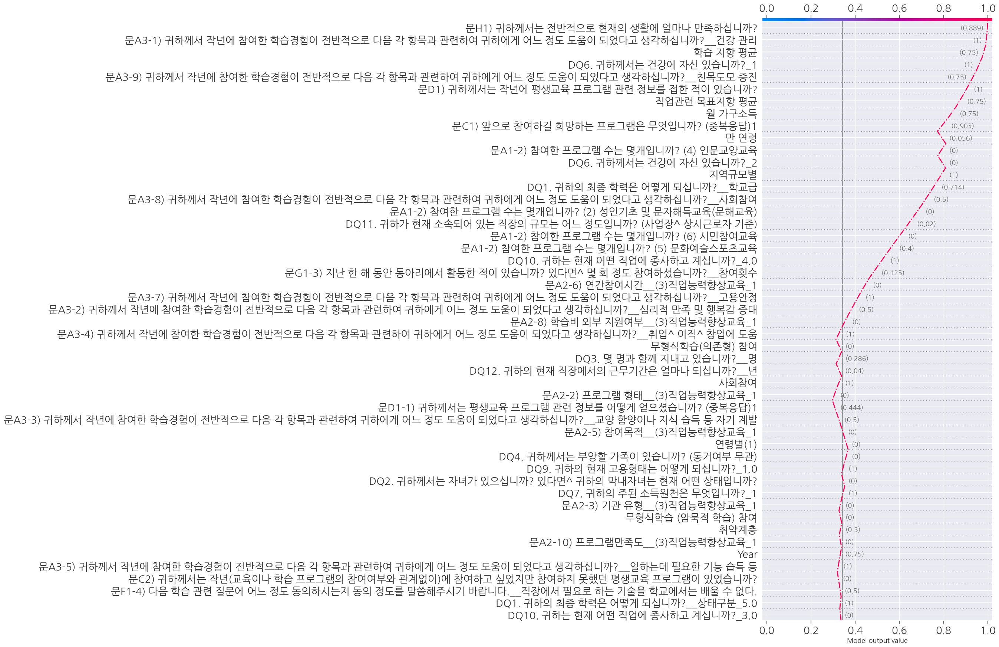

Test Dataset:
Individual Explanation(1 Decision Plot -> 1 Force Plot -> 1000 Force Plot)...


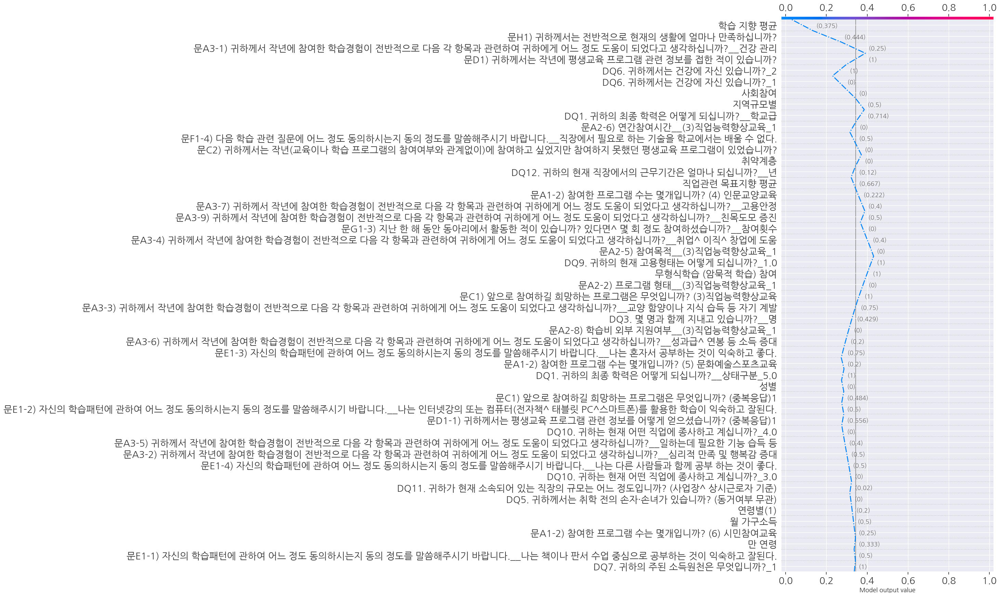

Train Dataset:
Total Explanation(Beeswarm Plot)...


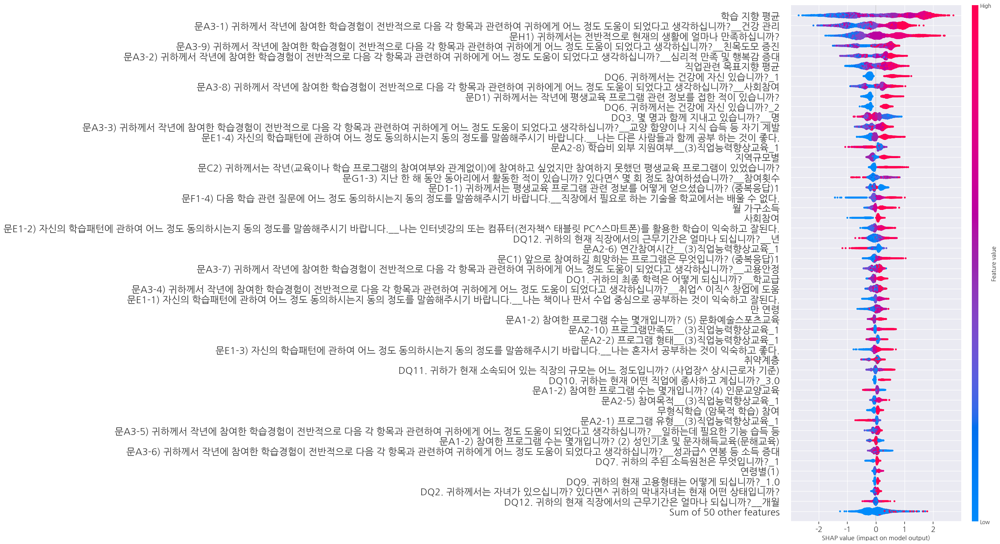

Test Dataset:
Total Explanation(Beeswarm Plot)...


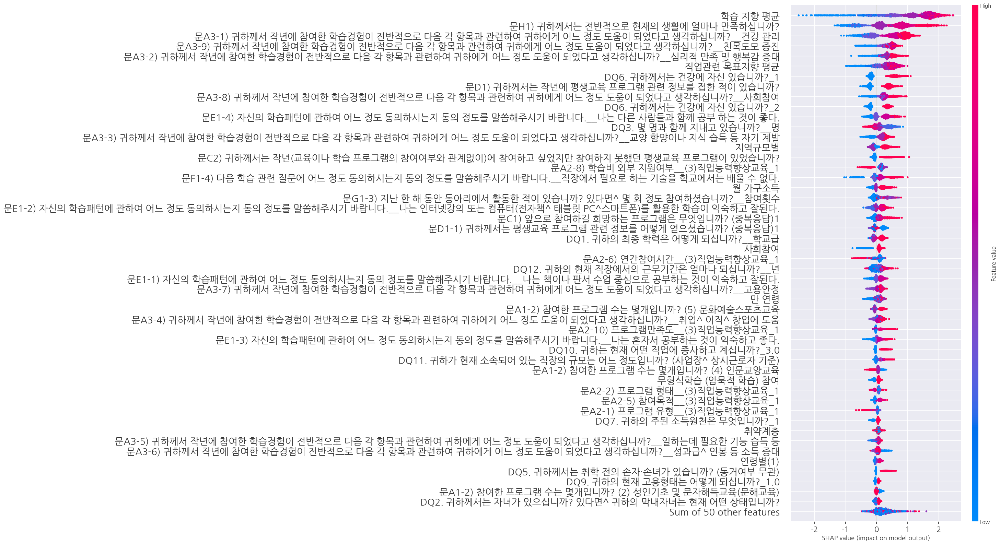

Train Dataset:
Feature Total Contribution...
Feature Contribution Direction...


100%|██████████████████████████████████████████████████████████████████████████████████| 99/99 [00:00<00:00, 130.31it/s]


,Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression)
0,학습 지향 평균,1.1435,2.2637,0.8383,7.2349,11.2136,DQ3. 몇 명과 함께 지내고 있습니까?__명,0.2339,0.4677,-0.6399,-1.1531,0.4060
1,문A3-1) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__건강 관리,0.6719,1.3506,0.7487,2.0716,7.5268,문A2-8) 학습비 외부 지원여부__(3)직업능력향상교육_1,0.1846,0.4319,-0.7154,-0.3932,0.2511
2,문H1) 귀하께서는 전반적으로 현재의 생활에 얼마나 만족하십니까?,0.6430,1.2877,0.9109,4.5361,0.0207,문D1-1) 귀하께서는 평생교육 프로그램 관련 정보를 어떻게 얻으셨습니까? (중복응답)1,0.1483,0.3050,-0.4008,-0.3316,0.5004
3,문A3-9) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__친목도모 증진,0.4714,0.9797,0.5785,1.2127,5.2454,문A2-6) 연간참여시간__(3)직업능력향상교육_1,0.1206,0.2576,-0.5294,-1.8100,-24.7916
4,문A3-2) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__심리적 만족 및 행복감 증대,0.4053,0.8365,0.5798,1.2366,5.1157,문A2-2) 프로그램 형태__(3)직업능력향상교육_1,0.0901,0.1888,-0.5402,-0.2763,0.6132


,Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression)
0,학습 지향 평균,1.1435,2.2637,0.8383,7.2349,11.2136,문A2-6) 연간참여시간__(3)직업능력향상교육_1,0.1206,0.2576,-0.5294,-1.8100,-24.7916
1,DQ11. 귀하가 현재 소속되어 있는 직장의 규모는 어느 정도입니까? (사업장^ 상시근로자 기준),0.0857,0.1786,0.5836,4.5653,1.4884,문A1-2) 참여한 프로그램 수는 몇개입니까? (4) 인문교양교육,0.0809,0.2233,-0.7171,-1.2423,-0.2113
2,문H1) 귀하께서는 전반적으로 현재의 생활에 얼마나 만족하십니까?,0.6430,1.2877,0.9109,4.5361,0.0207,DQ3. 몇 명과 함께 지내고 있습니까?__명,0.2339,0.4677,-0.6399,-1.1531,0.4060
3,직업관련 목표지향 평균,0.3756,0.7494,0.7887,2.3137,7.2964,문A1-2) 참여한 프로그램 수는 몇개입니까? (6) 시민참여교육,0.0382,0.1883,-0.7081,-0.5780,-0.4213
4,문A3-1) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__건강 관리,0.6719,1.3506,0.7487,2.0716,7.5268,문A2-8) 학습비 외부 지원여부__(3)직업능력향상교육_1,0.1846,0.4319,-0.7154,-0.3932,0.2511


Test Dataset:
Feature Total Contribution...
Feature Contribution Direction...


100%|██████████████████████████████████████████████████████████████████████████████████| 99/99 [00:00<00:00, 159.34it/s]


,Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression)
0,학습 지향 평균,1.2561,2.1166,0.9339,6.3013,0.0000,DQ3. 몇 명과 함께 지내고 있습니까?__명,0.2186,0.3659,-0.8933,-1.3151,-0.0852
1,문H1) 귀하께서는 전반적으로 현재의 생활에 얼마나 만족하십니까?,0.7056,1.3557,0.9300,5.0283,0.1732,문A2-8) 학습비 외부 지원여부__(3)직업능력향상교육_1,0.1817,0.4179,-0.7877,-0.3601,-0.3601
2,문A3-1) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__건강 관리,0.6025,1.0463,0.9476,1.9226,0.0000,문D1-1) 귀하께서는 평생교육 프로그램 관련 정보를 어떻게 얻으셨습니까? (중복응답)1,0.1290,0.2712,-0.5402,-0.3566,0.1232
3,문A3-9) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__친목도모 증진,0.4155,0.7068,0.8317,0.8626,0.0000,문A2-6) 연간참여시간__(3)직업능력향상교육_1,0.1210,0.2564,-0.6217,-2.7426,-28.3173
4,문A3-2) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__심리적 만족 및 행복감 증대,0.3844,0.5914,0.8683,0.9383,0.4828,문A1-2) 참여한 프로그램 수는 몇개입니까? (4) 인문교양교육,0.0836,0.1971,-0.8872,-1.2260,-0.4780


,Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression),Feature,Importance,Contribution Range,Contribution (Correlation),Contribution (Linear Regression),Contbituion (Quantile Regression)
0,DQ11. 귀하가 현재 소속되어 있는 직장의 규모는 어느 정도입니까? (사업장^ 상시근로자 기준),0.0851,0.1621,0.8853,7.2671,7.1354,문A2-6) 연간참여시간__(3)직업능력향상교육_1,0.1210,0.2564,-0.6217,-2.7426,-28.3173
1,학습 지향 평균,1.2561,2.1166,0.9339,6.3013,0.0000,DQ3. 몇 명과 함께 지내고 있습니까?__명,0.2186,0.3659,-0.8933,-1.3151,-0.0852
2,문H1) 귀하께서는 전반적으로 현재의 생활에 얼마나 만족하십니까?,0.7056,1.3557,0.9300,5.0283,0.1732,문A1-2) 참여한 프로그램 수는 몇개입니까? (4) 인문교양교육,0.0836,0.1971,-0.8872,-1.2260,-0.4780
3,직업관련 목표지향 평균,0.3832,0.6737,0.8692,1.9998,0.0000,문A1-2) 참여한 프로그램 수는 몇개입니까? (6) 시민참여교육,0.0393,0.1801,-0.8755,-0.7658,-0.5493
4,문A3-1) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__건강 관리,0.6025,1.0463,0.9476,1.9226,0.0000,문A2-8) 학습비 외부 지원여부__(3)직업능력향상교육_1,0.1817,0.4179,-0.7877,-0.3601,-0.3601


Train Dataset:
Feature Interactive Contribution...


100%|██████████████████████████████████████████████████████████████████████████████████| 99/99 [00:00<00:00, 237.40it/s]


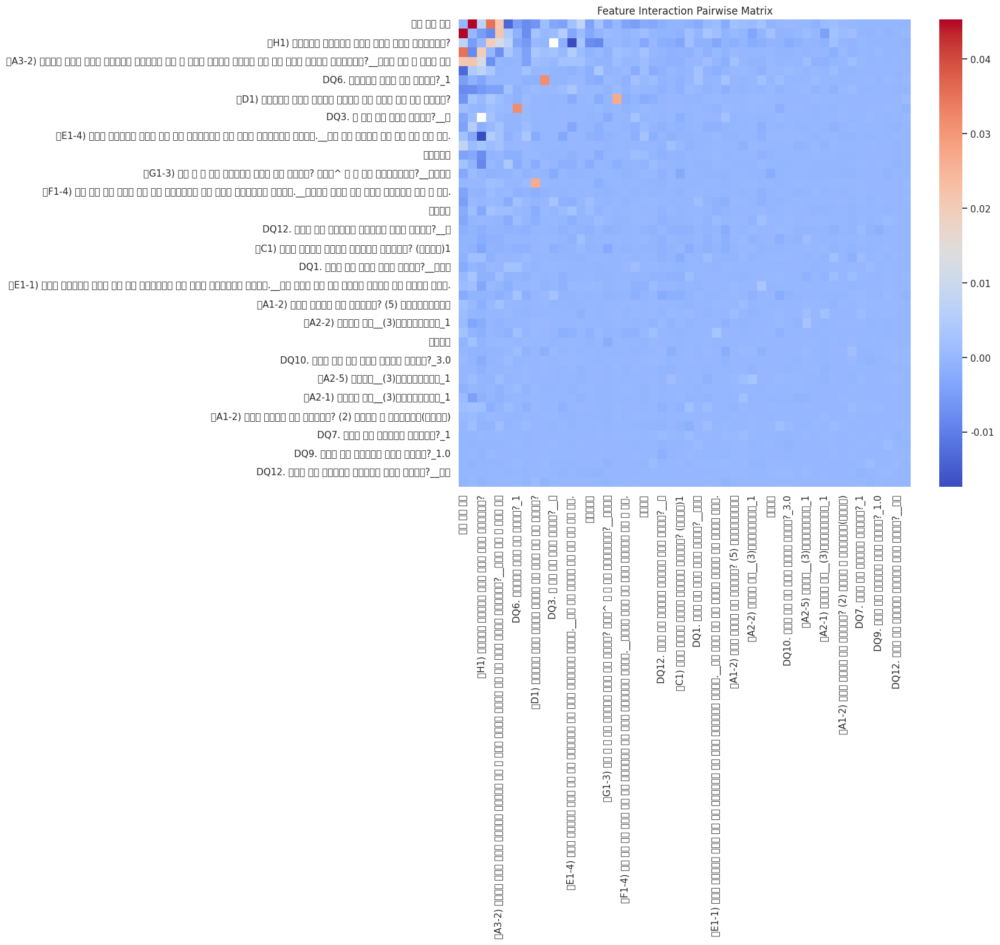

100%|██████████████████████████████████████████████████████████████████████████████████| 99/99 [00:00<00:00, 191.47it/s]


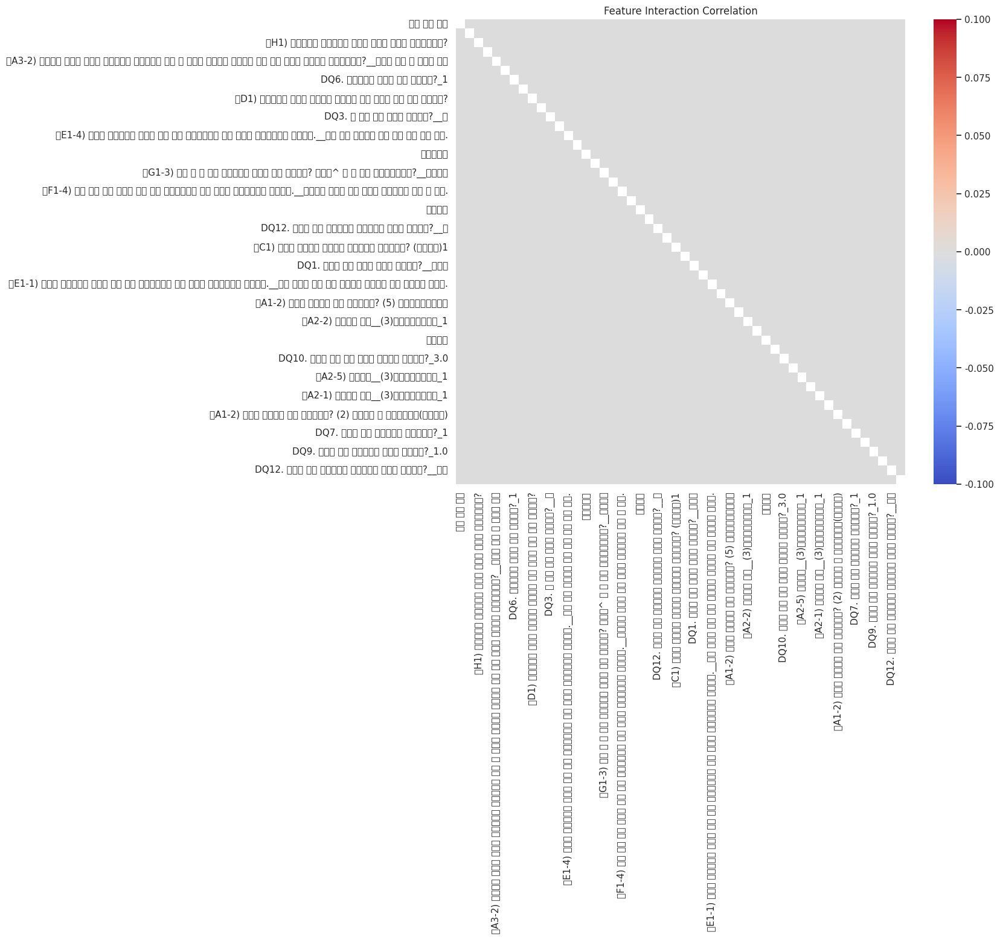

Test Dataset:
Feature Interactive Contribution...


100%|██████████████████████████████████████████████████████████████████████████████████| 99/99 [00:00<00:00, 236.25it/s]


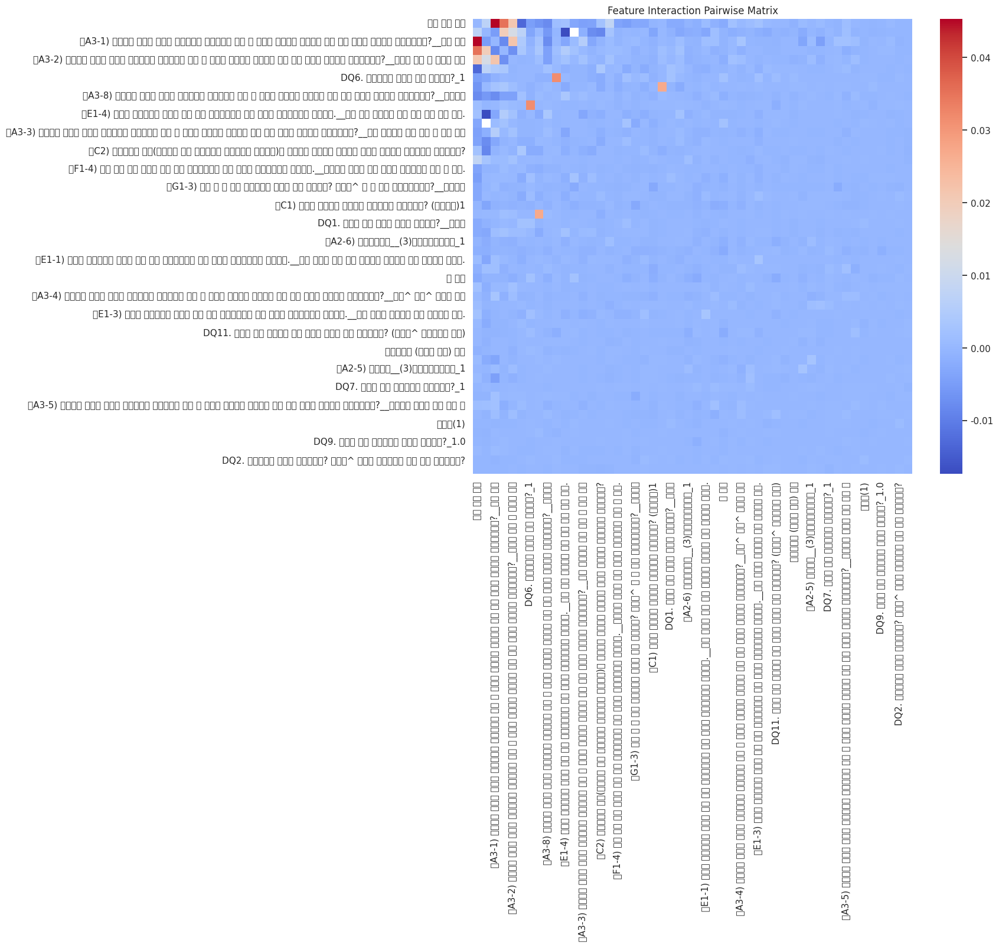

100%|██████████████████████████████████████████████████████████████████████████████████| 99/99 [00:00<00:00, 223.28it/s]


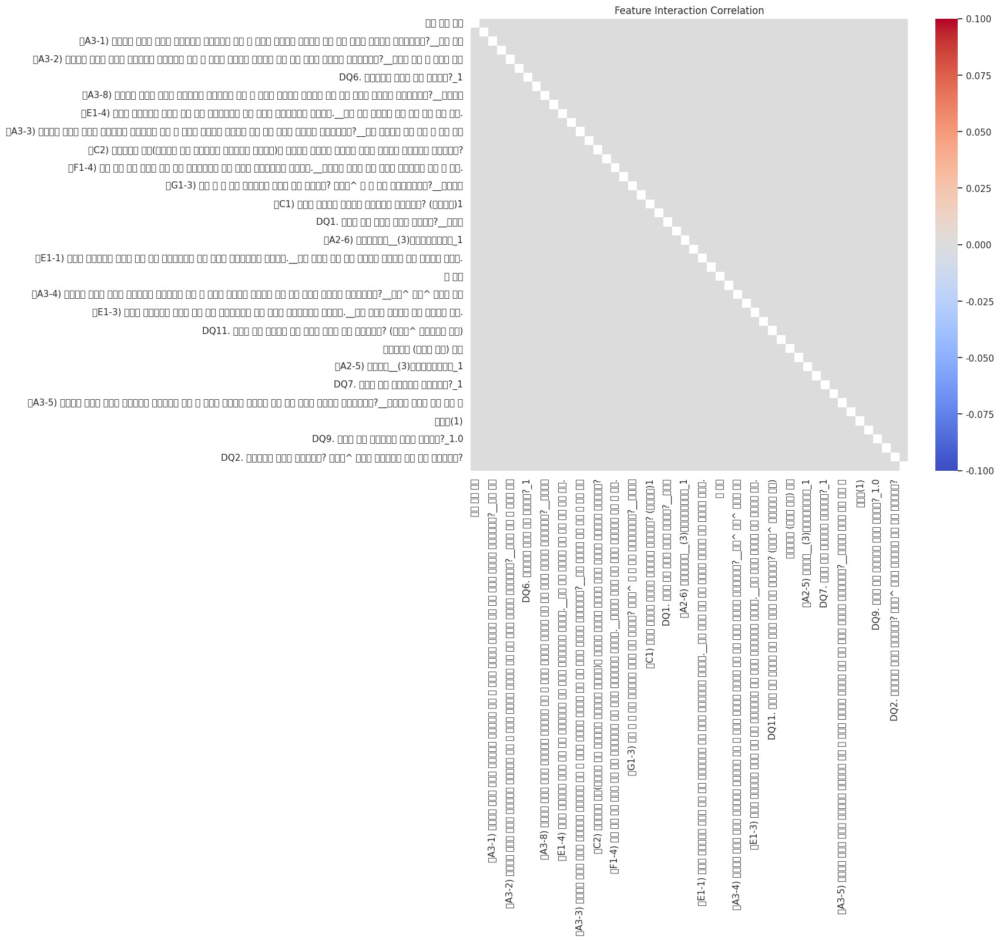

In [16]:
model = XGBClassifier(**best_params)
model.fit(X_train, Y_train)
explanation_SHAP(model, X_train, X_validate, X_colname,
                 model_type='Tree', output_type='logit',
                 max_display=X_TOP_DISPLAY, dependency=not DEPENDENCY)

In [30]:
# model_xgb, Score_te_xgb, Score_trte_xgb = modeling_XGBClassifier(X_train, Y_train, X_validate, Y_validate, 
#                                                              X_colname=X_colname, 
#                                                              tune_trials=TUNE_TRIALS,
#                                                              cv_splits=CV_SPLITS,
#                                                              tune_metric=TUNE_METRIC,
#                                                              shap=SHAP, 
#                                                              X_top_display=X_TOP_DISPLAY, 
#                                                              dependency=not DEPENDENCY,
#                                                              label_list=LABEL_LIST)
# display(model_xgb, Score_te_xgb, Score_trte_xgb)

# Understanding of Target Prediction

In [25]:
# Target Prediction
## Train
Y_trpred = pd.DataFrame(model.predict(X_train), columns=[Y_colname])
print(Y_trpred.value_counts())
print(Y_trpred.value_counts() / np.sum(Y_trpred.value_counts()))
X_tr = pd.DataFrame(X_train, columns=X_colname)
comparisonstat_origin = table_ratiobyclass(pd.concat([Y_trpred, X_tr], axis=1), Y_colname, 
                                           label_list=LABEL_LIST, sorting=True, 
                                           save=True, save_name=SAVE_NAME_PREDSTATTR)
display(comparisonstat_origin)
## Test
Y_tepred = pd.DataFrame(model.predict(X_test), columns=[Y_colname])
print(Y_tepred.value_counts())
print(Y_tepred.value_counts() / np.sum(Y_tepred.value_counts()))
X_te = pd.DataFrame(X_test, columns=X_colname)
comparisonstat_origin = table_ratiobyclass(pd.concat([Y_tepred, X_te], axis=1), Y_colname, 
                                           label_list=LABEL_LIST, sorting=True, 
                                           save=True, save_name=SAVE_NAME_PREDSTATTE)
display(comparisonstat_origin)

학습효과성
1        5726
0        5658
Name: count, dtype: int64
학습효과성
1       0.5030
0       0.4970
Name: count, dtype: float64
Number of significant features:  91 (0.9191919191919192%)


Non-satisfaction  \
문H1) 귀하께서는 전반적으로 현재의 생활에 얼마나 만족하십니까?              0.0000      10 (58.82%)   
                                                  0.1111      36 (85.71%)   
                                                  0.2222     145 (88.96%)   
                                                  0.3333     324 (92.31%)   
                                                  0.4444    1218 (83.03%)   
...                                                                   ...   
DQ6. 귀하께서는 건강에 자신 있습니까?_4                         1.0000      27 (47.37%)   
문A1-2) 참여한 프로그램 수는 몇개입니까? (2) 성인기초 및 문자해득교육(문해교육) 0.0000    1662 (42.02%)   
                                                  0.5000    2498 (42.24%)   
DQ7. 귀하의 주된 소득원천은 무엇입니까?_6                        0.0000    5658 (49.71%)   
DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_11.0               0.0000    5658 (49.71%)   

                                                           Satisfaction  \
문H1) 귀하께서는 전반적으로 현재의 생활에 얼마나 만족하십니까?              0.0000     7 (41.18%)   
                                                  0.1111     6 (14.29%)   
                                                  0.2222    18 (11.04%)   
                                                  0.3333     27 (7.69%)   
                                                  0.4444   249 (16.97%)   
...                                                                 ...   
DQ6. 귀하께서는 건강에 자신 있습니까?_4                         1.0000    30 (52.63%)   
문A1-2) 참여한 프로그램 수는 몇개입니까? (2) 성인기초 및 문자해득교육(문해교육) 0.0000  2293 (57.98%)   
                                                  0.5000  3416 (57.76%)   
DQ7. 귀하의 주된 소득원천은 무엇입니까?_6                        0.0000  5725 (50.29%)   
DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_11.0               0.0000  5723 (50.29%)   

                                                                          Statistics  
문H1) 귀하께서는 전반적으로 현재의 생활에 얼마나 만족하십니까?              0.0000  $\chi^2$=3400.47, $p$=0.00  
                                                  0.1111                              
                                                  0.2222                              
                                                  0.3333                              
                                                  0.4444                              
...                                                                              ...  
DQ6. 귀하께서는 건강에 자신 있습니까?_4                         1.0000                              
문A1-2) 참여한 프로그램 수는 몇개입니까? (2) 성인기초 및 문자해득교육(문해교육) 0.0000     $\chi^2$=0.04, $p$=0.85  
                                                  0.5000                              
DQ7. 귀하의 주된 소득원천은 무엇입니까?_6                        0.0000         $T$=-0.99, $p$=0.32  
DQ10. 귀하는 현재 어떤 직업에 종사하고 계십니까?_11.0               0.0000         $T$=-1.72, $p$=0.09  

[606 rows x 3 columns]

학습효과성
1        7922
0        4592
Name: count, dtype: int64
학습효과성
1       0.6331
0       0.3669
Name: count, dtype: float64
Number of significant features:  65 (0.6565656565656566%)


Non-satisfaction  \
문H1) 귀하께서는 전반적으로 현재의 생활에 얼마나 만족하십니까?                                               0.0000       8 (88.89%)   
                                                                                   0.1000      27 (84.38%)   
                                                                                   0.2000      56 (84.85%)   
                                                                                   0.3000     158 (85.41%)   
                                                                                   0.4000     247 (84.30%)   
...                                                                                                    ...   
문A3-7) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__고용안정    0.0000    4592 (36.69%)   
문A3-8) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__사회참여    0.0000    4592 (36.69%)   
문A3-9) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__친목도모 증진 0.0000    4592 (36.69%)   
문D1-1) 귀하께서는 평생교육 프로그램 관련 정보를 어떻게 얻으셨습니까? (중복응답)1                                  0.0000    4592 (36.69%)   
문G1-3) 지난 한 해 동안 동아리에서 활동한 적이 있습니까? 있다면^ 몇 회 정도 참여하셨습니까?__참여횟수                     0.0000    4592 (36.69%)   

                                                                                            Satisfaction  \
문H1) 귀하께서는 전반적으로 현재의 생활에 얼마나 만족하십니까?                                               0.0000     1 (11.11%)   
                                                                                   0.1000     5 (15.62%)   
                                                                                   0.2000    10 (15.15%)   
                                                                                   0.3000    27 (14.59%)   
                                                                                   0.4000    46 (15.70%)   
...                                                                                                  ...   
문A3-7) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__고용안정    0.0000  7922 (63.31%)   
문A3-8) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__사회참여    0.0000  7922 (63.31%)   
문A3-9) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__친목도모 증진 0.0000  7922 (63.31%)   
문D1-1) 귀하께서는 평생교육 프로그램 관련 정보를 어떻게 얻으셨습니까? (중복응답)1                                  0.0000  7922 (63.31%)   
문G1-3) 지난 한 해 동안 동아리에서 활동한 적이 있습니까? 있다면^ 몇 회 정도 참여하셨습니까?__참여횟수                     0.0000  7922 (63.31%)   

                                                                                                           Statistics  
문H1) 귀하께서는 전반적으로 현재의 생활에 얼마나 만족하십니까?                                               0.0000  $\chi^2$=3104.41, $p$=0.00  
                                                                                   0.1000                              
                                                                                   0.2000                              
                                                                                   0.3000                              
                                                                                   0.4000                              
...                                                                                                               ...  
문A3-7) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__고용안정    0.0000            $T$=nan, $p$=nan  
문A3-8) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__사회참여    0.0000            $T$=nan, $p$=nan  
문A3-9) 귀하께서 작년에 참여한 학습경험이 전반적으로 다음 각 항목과 관련하여 귀하에게 어느 정도 도움이 되었다고 생각하십니까?__친목도모 증진 0.0000            $T$=nan, $p$=nan  
문D1-1) 귀하께서는 평생교육 프로그램 관련 정보를 어떻게 얻으셨습니까? (중복응답)1                                  0.0000            $T$=nan, $p$=nan  
문G1-3) 지난 한 해 동안 동아리에서 활동한 적이 있습니까? 있다면^ 몇 회 정도 참여하셨습니까?__참여횟수                     0.0000            $T$=nan, $p$=nan  

[394 rows x 3 columns]